In [1]:
from sklearn.manifold import TSNE
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import scipy
import scipy.stats
from scipy import signal
import h5py
import pandas as pd
import cv2
import time
import umap
import umap.plot

#import datashader as ds
#import colorcet as cc

In [2]:
N = 5 # num of bats

In [3]:
df = pd.read_csv('../matlab/210305_bat_pos_mat.csv', header=None)
df.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
0,-1.435774,-1.672972,0.144559,-1.037958,-1.769263,-0.018359,-1.261315,-1.687885,-0.001964,-1.356209,-1.515319,0.008428,-1.102262,-1.630002,-0.015653
1,-1.436044,-1.673943,0.147543,-1.038876,-1.770269,-0.017321,-1.263208,-1.694802,-0.001355,-1.352732,-1.518650,0.008239,-1.102590,-1.627920,-0.014263
2,-1.436309,-1.674900,0.150503,-1.039781,-1.771275,-0.016288,-1.265058,-1.701635,-0.000741,-1.349269,-1.521953,0.008052,-1.102931,-1.625869,-0.012886
3,-1.436568,-1.675845,0.153437,-1.040674,-1.772280,-0.015258,-1.266867,-1.708386,-0.000122,-1.345818,-1.525227,0.007868,-1.103285,-1.623849,-0.011521
4,-1.436820,-1.676776,0.156346,-1.041554,-1.773284,-0.014233,-1.268634,-1.715054,0.000503,-1.342381,-1.528474,0.007685,-1.103652,-1.621859,-0.010170


In [4]:
sessions = ['210222', '210223', '210224', '210225', '210226', '210301', '210302', '210303', '210304', '210305']

In [5]:
session_data = {}
for session in sessions:
    session_data[session] = scipy.io.loadmat('../data/{}/rtls/Analysis_{}/Analysis_{}.mat'.format(session, session, session))

C:\Users\Kevin\Anaconda3\envs\lfp-behavior\lib\site-packages\scipy\io\matlab\mio.py:226: MatReadWarning: Duplicate variable name "None" in stream - replacing previous with new
Consider mio5.varmats_from_mat to split file into single variable files
  matfile_dict = MR.get_variables(variable_names)


In [183]:
pos_data = np.zeros((len(sessions), 350001, N, 2))
bflying = np.zeros((len(sessions), 350001, N, 1))
print("pos_data shape", pos_data.shape)
for snum in range(len(sessions)):
    for bnum in range(N):
        pos_data[snum, :, bnum, :] = session_data[sessions[snum]]['tag_data_filt'][0][bnum][:350001, 2:4]
        bflying[snum, :, bnum, :] = session_data[sessions[snum]]['bflying'][:350001, bnum].reshape(-1, 1)
vel_data = np.diff(pos_data, axis=1)
print("vel_data shape", vel_data.shape)
speed_data = np.linalg.norm(vel_data, axis=3)
speed_data = np.concatenate(speed_data, axis=0)
print("Speed Data shape", speed_data.shape)

print(np.concatenate(bflying[:,:350000,:,:], axis=0).shape)
bflying = np.concatenate(bflying[:,:350000,:,:], axis=0)

temp = np.concatenate(pos_data[:, :350000,:,:], axis=0)
X = np.concatenate(np.moveaxis(temp, 0,-1), axis=0).T
print("Data matrix shape", X.shape)



pos_data shape (10, 350001, 5, 2)
vel_data shape (10, 350000, 5, 2)
Speed Data shape (3500000, 5)
(3500000, 5, 1)
Data matrix shape (3500000, 10)


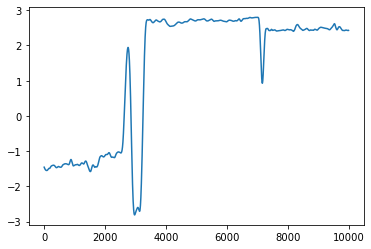

In [139]:
plt.plot(pos_data[0,:10000, 0, 0])

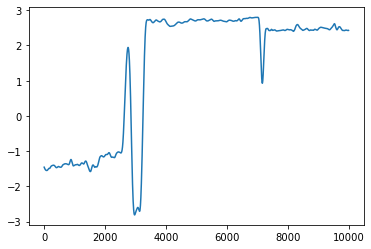

In [145]:
plt.plot(X[:10000, 0])

In [47]:
(np.sum(bflying, axis=1) == 0).reshape(-1).shape

(3500000,)

In [137]:
X

array([[-1.45592652, -1.36625759, -1.72964933, ..., -1.42050487,
        -1.11256729, -1.43577385],
       [-1.70662211, -2.0645722 , -2.2291038 , ..., -1.60836382,
        -1.62493483, -1.67297197],
       [-1.93980902, -1.2804812 , -1.24900943, ..., -1.39874002,
        -1.03409013, -1.03795837],
       ...,
       [-2.49800885, -2.47625917, -2.50000471, ...,  2.49999731,
         2.16983673,  2.49884595],
       [ 2.58565595, -2.05731898,  2.26760445, ...,  2.7741799 ,
         2.79979517,  1.96817875],
       [-2.49851295,  2.5       , -2.0480014 , ..., -2.19018755,
         1.85825065, -2.5       ]])

In [103]:
session_data['210222']['tag_data_filt'][0][0].shape

(360159, 8)

In [180]:
bflying_df = pd.read_csv('../matlab/210305_bflying_mat.csv', header=None)
bflying_df.head()

,0,1,2,3,4
0,0,0,0,0,0
1,0,0,0,0,0
2,0,0,0,0,0
3,0,0,0,0,0
4,0,0,0,0,0


In [9]:
X = np.array(df) # Data matrix
#X = scipy.signal.resample(X, int(len(X)//10))
#X = X[2000:, :]
V = np.diff(X, axis=0)
X = X[:len(V), :]
print(X.shape, V.shape)

(349999, 15) (349999, 15)


In [182]:
bflying

array([[0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0],
       ...,
       [1, 0, 0, 0, 0],
       [1, 0, 0, 0, 0],
       [1, 0, 0, 0, 0]], dtype=int64)

In [181]:
bflying = np.array(bflying_df)
#bflying_ds = bflying[::10]
#bflying_ds = bflying_ds[2000:,:]
bflying = bflying[:len(V), :]
bflying.shape

NameError: name 'V' is not defined

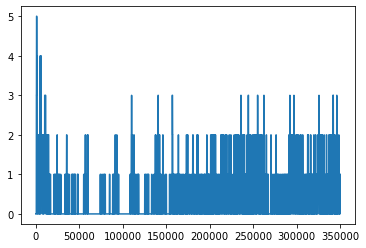

In [11]:
plt.plot(np.sum(bflying, axis=1))

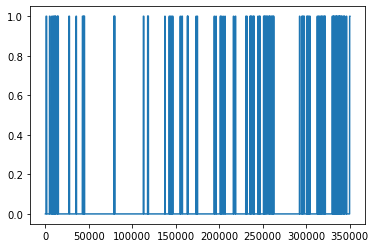

In [12]:
plt.plot(bflying[:,0])

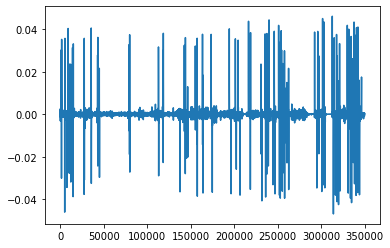

In [16]:
plt.plot(V[:, 1])

(array([2.87563e+05, 2.84440e+04, 5.20000e+03, 2.21300e+03, 1.84500e+03,
        1.69800e+03, 1.83700e+03, 1.79800e+03, 1.58100e+03, 1.52000e+03,
        1.43700e+03, 1.28300e+03, 1.33100e+03, 1.19500e+03, 1.12600e+03,
        1.03200e+03, 9.01000e+02, 9.96000e+02, 9.33000e+02, 8.49000e+02,
        8.89000e+02, 9.46000e+02, 9.49000e+02, 9.13000e+02, 6.72000e+02,
        3.64000e+02, 2.17000e+02, 1.27000e+02, 8.50000e+01, 5.50000e+01]),
 array([3.56325617e-07, 2.21328313e-03, 4.42620993e-03, 6.63913674e-03,
        8.85206354e-03, 1.10649903e-02, 1.32779171e-02, 1.54908439e-02,
        1.77037708e-02, 1.99166976e-02, 2.21296244e-02, 2.43425512e-02,
        2.65554780e-02, 2.87684048e-02, 3.09813316e-02, 3.31942584e-02,
        3.54071852e-02, 3.76201120e-02, 3.98330388e-02, 4.20459656e-02,
        4.42588924e-02, 4.64718192e-02, 4.86847460e-02, 5.08976728e-02,
        5.31105996e-02, 5.53235264e-02, 5.75364532e-02, 5.97493800e-02,
        6.19623068e-02, 6.41752336e-02, 6.63881604e-02])

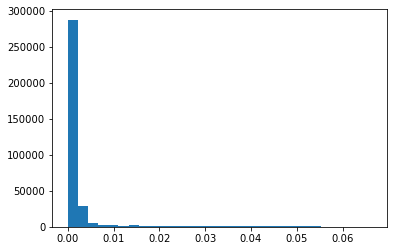

In [21]:
plt.hist(np.sqrt(V[:,1]**2+V[:,1]**2+V[:,2]**2), bins=30)

In [69]:
(bflying[:, 1] == 0).shape

(350000,)

In [71]:
X[bflying[:, 1] == 0, 1].shape

(284722,)

In [74]:
stat_time_points

array([     0,      1,      2, ..., 349752, 349753, 349754])

# Debug Bflying

In [155]:
X.shape

(3500000, 10)

In [156]:
test = X[:,0][:1000]

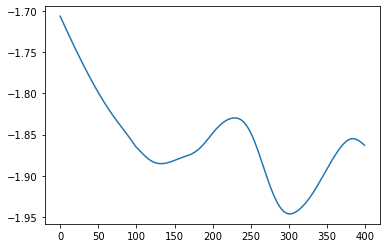

In [157]:
plt.plot(X[:,1][:400])

In [163]:
(np.sum(bflying, axis=1) == 0).shape

(3500000, 1)

In [176]:
np.max(speed_data[(np.sum(bflying, axis=1) == 0).reshape(-1)], axis=1).shape

(2122458,)

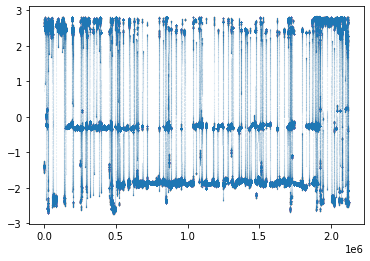

In [205]:
plt.scatter(np.arange(len(X[(np.sum(bflying, axis=1) == 0).reshape(-1)])), X[(np.sum(bflying, axis=1) == 0).reshape(-1),0], s=0.001)

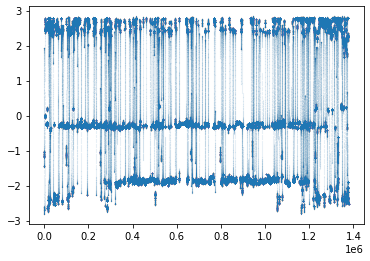

In [206]:
plt.scatter(np.arange(len(X[(np.sum(bflying, axis=1) > 0).reshape(-1)])), X[(np.sum(bflying, axis=1) >0).reshape(-1),0], s=0.001)

(-2.8, 2.8)

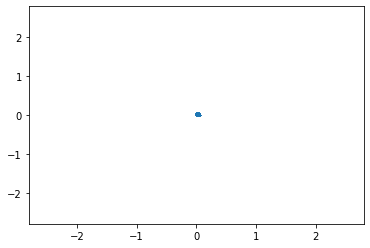

In [166]:
plt.scatter(speed_data[(np.sum(bflying, axis=1) == 0).reshape(-1),0], speed_data[(np.sum(bflying, axis=1) == 0).reshape(-1),1], s=0.01)
plt.xlim(-2.8, 2.8)
plt.ylim(-2.8, 2.8)

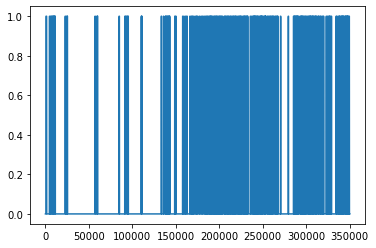

In [198]:
plt.plot(np.array(bflying_df)[:,1])

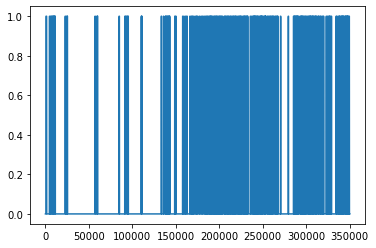

In [199]:
plt.plot(bflying[-350000:, 1])

In [158]:
plt.scatter(np.arange(len(X[bflying[:, 3] == 0, 1])), X[bflying[:, 3] == 0, 1], s=0.01)

IndexError: too many indices for array: array is 2-dimensional, but 4 were indexed

In [142]:
flight_start = []
flight_end = []
flag = True
for t in range(len(X)):
    if(bflying[t, 0] == 1 and flag):
        flight_start.append(t)
        flag = False
    elif(bflying[t, 0] == 0 and not flag):
        flight_end.append(t)
        flag = True

In [143]:
flight_start

[677,
 4622,
 7206,
 8559,
 9669,
 10900,
 11514,
 13657,
 14200,
 26899,
 35139,
 42442,
 43832,
 44446,
 78608,
 79175,
 112540,
 117458,
 117879,
 137257,
 142235,
 143381,
 144831,
 146104,
 154929,
 156747,
 163166,
 163557,
 173128,
 174438,
 193997,
 196024,
 200979,
 201949,
 204048,
 206337,
 216117,
 218225,
 230341,
 231496,
 235125,
 235779,
 236963,
 238873,
 239724,
 244246,
 245725,
 246573,
 250759,
 251720,
 252426,
 253716,
 254929,
 257055,
 257491,
 258916,
 260179,
 261366,
 262227,
 292128,
 294750,
 295757,
 296837,
 300337,
 301336,
 302723,
 303922,
 312480,
 313760,
 314650,
 316056,
 317369,
 317936,
 319472,
 320746,
 321433,
 329746,
 330828,
 331432,
 331973,
 333379,
 334082,
 334634,
 335525,
 336707,
 337503,
 337993,
 338722,
 339809,
 340344,
 341775,
 343097,
 343768,
 345986,
 349755]

In [144]:
flight_end

[1392,
 5194,
 7513,
 8870,
 10274,
 11243,
 11983,
 13949,
 14806,
 27613,
 35636,
 43145,
 44146,
 44933,
 78919,
 79908,
 113092,
 117823,
 118377,
 137570,
 142528,
 143852,
 145082,
 146544,
 155220,
 157480,
 163513,
 164037,
 173402,
 174865,
 194368,
 196331,
 201317,
 202334,
 204398,
 206631,
 216388,
 218740,
 230694,
 231804,
 235463,
 236319,
 237629,
 239244,
 240044,
 244556,
 246038,
 246878,
 251060,
 252013,
 252945,
 254447,
 255849,
 257463,
 257904,
 259413,
 260700,
 261725,
 262627,
 292417,
 295156,
 296091,
 297680,
 300708,
 301875,
 302989,
 304294,
 312742,
 314029,
 314947,
 316350,
 317695,
 318397,
 320011,
 321122,
 321786,
 330068,
 331146,
 331702,
 332222,
 333677,
 334455,
 334919,
 335983,
 337069,
 337798,
 338420,
 339030,
 340104,
 340633,
 342333,
 343401,
 344108,
 346356]

677 1392


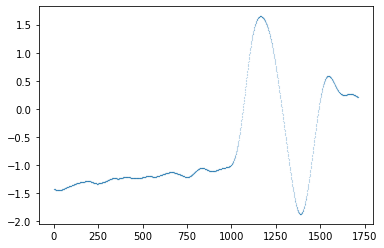

In [146]:
flight_num = 0
print(flight_start[flight_num], flight_end[flight_num])
flight_seg = X[flight_start[flight_num]-500:flight_end[flight_num]+500,0]
plt.scatter(np.arange(len(flight_seg)), flight_seg, s=0.01)

# Stationary Timepoints

In [211]:
np.arange(len(bflying))[(np.sum(bflying, axis=1) == 0).reshape(-1)].shape

(2122458,)

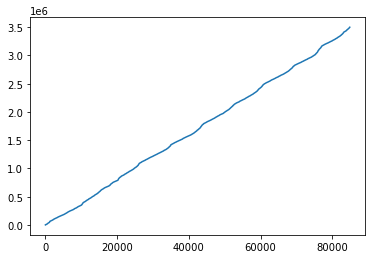

In [218]:
stat_time_points = np.arange(len(bflying))[(np.sum(bflying, axis=1) == 0).reshape(-1)][::25]
assert sum(bflying[stat_time_points]).all() == 0
plt.plot(stat_time_points)

In [171]:
np.max(speed_data, axis=1).shape

(3500000,)

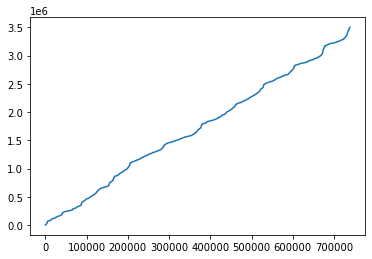

In [195]:
stat_time_points = np.arange(len(X))[np.max(speed_data, axis=1) < 0.001]
#assert sum(bflying[stat_time_points]).all() == 0
plt.plot(stat_time_points)

# Interbat distances

In [219]:
inter_bat_dist = np.zeros((len(stat_time_points), int(N*(N-1)/2))) # shape: (n_samples, N*(N-1)/2)
inter_bat_key = {}
for j in range(len(stat_time_points)): # For each time point
    i = 0
    t = stat_time_points[j]
    for b1 in range(N): # For each bat
        for b2 in range(b1+1, N): # For each other bat
            r1 = X[t][b1*2:(b1+1)*2] # X,Y,Z pos of bat 1
            r2 = X[t][b2*2:(b2+1)*2] # X,Y,Z pos of bat 2
            inter_bat_dist[j,i] = np.linalg.norm(r1 - r2)
            inter_bat_key[i] = (b1,b2)
            i += 1
            assert i <= 10
            

In [220]:
inter_bat_dist.shape

(84899, 10)

In [221]:
inter_bat_key

{0: (0, 1),
 1: (0, 2),
 2: (0, 3),
 3: (0, 4),
 4: (1, 2),
 5: (1, 3),
 6: (1, 4),
 7: (2, 3),
 8: (2, 4),
 9: (3, 4)}

In [223]:
inter_bat_dist_ds = scipy.signal.resample(inter_bat_dist, int(len(inter_bat_dist)))

In [224]:
inter_bat_dist_ds.shape

(84899, 10)

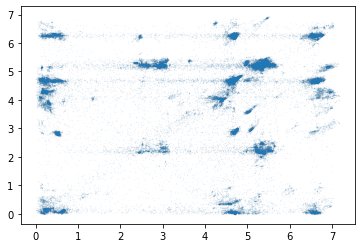

In [225]:
plt.scatter(inter_bat_dist_ds[:,0], inter_bat_dist_ds[:,1], s=0.0005)

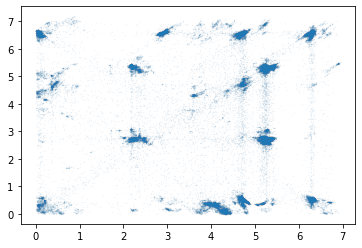

In [226]:
plt.scatter(inter_bat_dist_ds[:,1], inter_bat_dist_ds[:,2], s=0.0005)

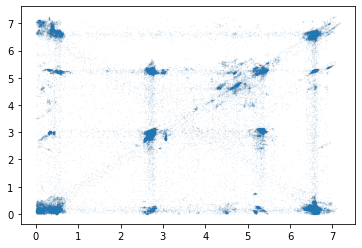

In [227]:
plt.scatter(inter_bat_dist_ds[:,2], inter_bat_dist_ds[:,3], s=0.0005)

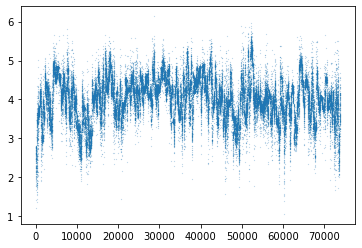

In [203]:
plt.scatter(np.arange(len(inter_bat_dist_ds)), inter_bat_dist_ds[:,0], s=0.01)

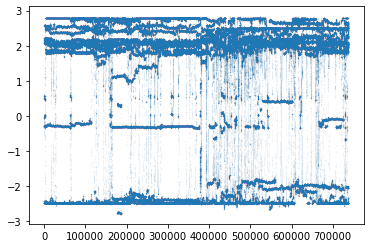

In [204]:
plt.scatter(np.arange(len(stat_time_points)), X[stat_time_points,1], s=0.0005)

# Egocentric Distances

In [236]:
ego_bat = 0

egocentric_dist = np.zeros((len(stat_time_points), N-1)) # shape: (n_samples, N*(N-1)/2)
egocentric_key = {}
for j in range(len(stat_time_points)): # For each time point
    i = 0
    t = stat_time_points[j]
    for b2 in np.delete(np.arange(N), ego_bat): # For each bat
        r1 = X[t][ego_bat*2:(ego_bat+1)*2] # X,Y,Z pos of bat 1
        r2 = X[t][b2*2:(b2+1)*2] # X,Y,Z pos of bat 2
        egocentric_dist[j,i] = np.linalg.norm(r1 - r2)
        inter_bat_key[i] = b2
        i += 1

In [246]:
egocentric_dist.shape

(84899, 4)

# Flight times and stationary times

In [15]:
plt.plot(bflying_ds[:,2])

NameError: name 'bflying_ds' is not defined

In [ ]:
bflying_colormap = []
for i in range(len(bflying_ds)):
    if(bflying_ds[i,0] == 1):
        bflying_colormap.append('#e6194B') # red
    elif(bflying_ds[i,1] == 1):
        bflying_colormap.append('#f58231') # orange
    elif(bflying_ds[i,2] == 1):
        bflying_colormap.append('#ffe119') # yellow
    elif(bflying_ds[i,3] == 1):
        bflying_colormap.append('#3cb44b') # green
    elif(bflying_ds[i,4] == 1):
        bflying_colormap.append('#42d4f4') # cyan
    else:
        bflying_colormap.append('#c0c0c0') # grey

In [ ]:
bforage_colormap = []
for i in range(len(bflying_ds)):
    if(np.linalg.norm(X[i,:3] - np.array([-0.29, 0.05, 0.45])) < 0.2):
        bforage_colormap.append('#e6194B') # red
    elif(np.linalg.norm(X[i,3:6] - np.array([-0.29, 0.05, 0.45])) < 0.2):
        bforage_colormap.append('#f58231') # orange
    elif(np.linalg.norm(X[i,9:12] - np.array([-0.29, 0.05, 0.45])) < 0.2):
        bforage_colormap.append('#3cb44b') # green
    elif(np.linalg.norm(X[i,12:15] - np.array([-0.29, 0.05, 0.45])) < 0.2):
        bforage_colormap.append('#42d4f4') # cyan
    elif(np.linalg.norm(X[i,6:9] - np.array([-0.29, 0.05, 0.45])) < 0.2):
        bforage_colormap.append('#ffe119') # yellow
    else:
        bforage_colormap.append('#c0c0c0') # grey

In [ ]:
plt.figure(dpi=160)
plt.plot([c == '#f58231' for c in bforage_colormap])

# UMAP

In [248]:
0

0

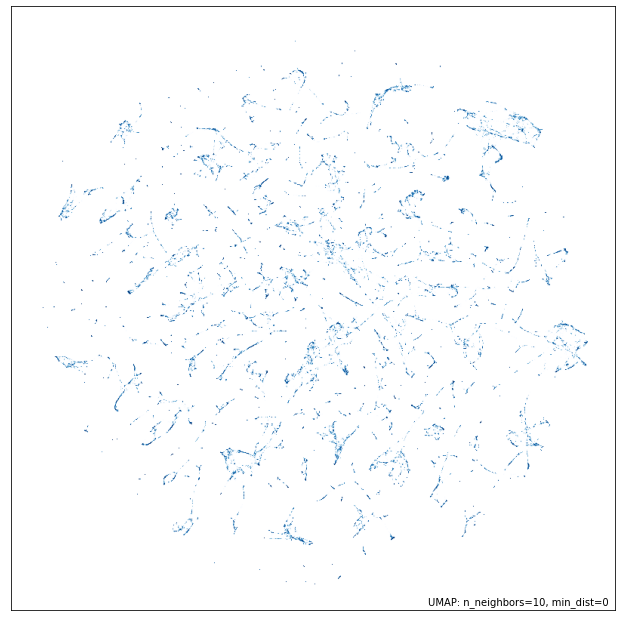

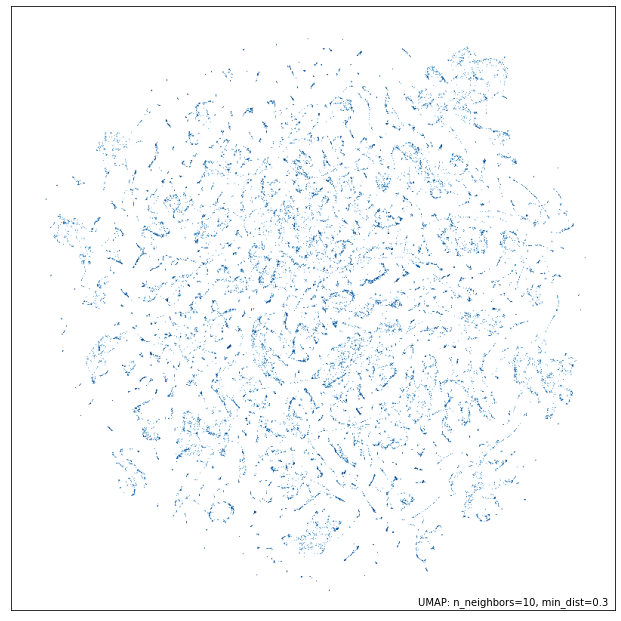

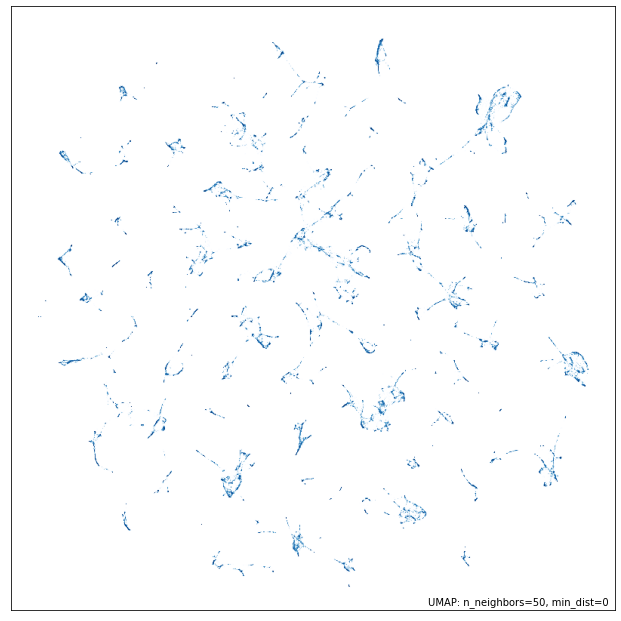

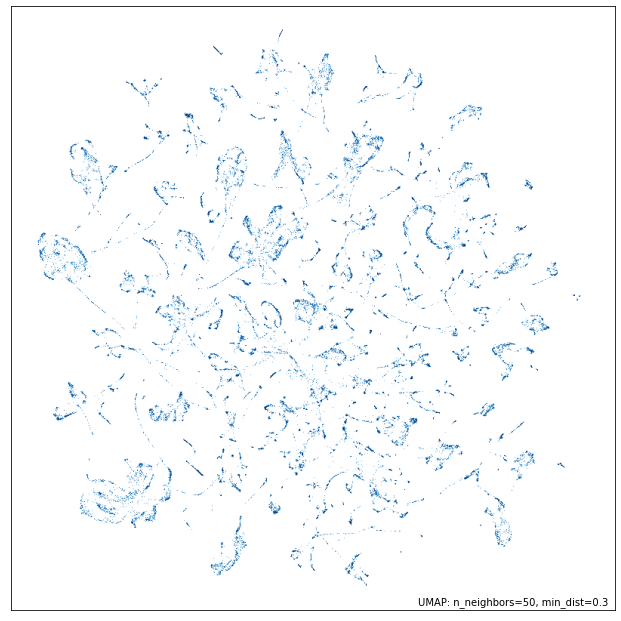

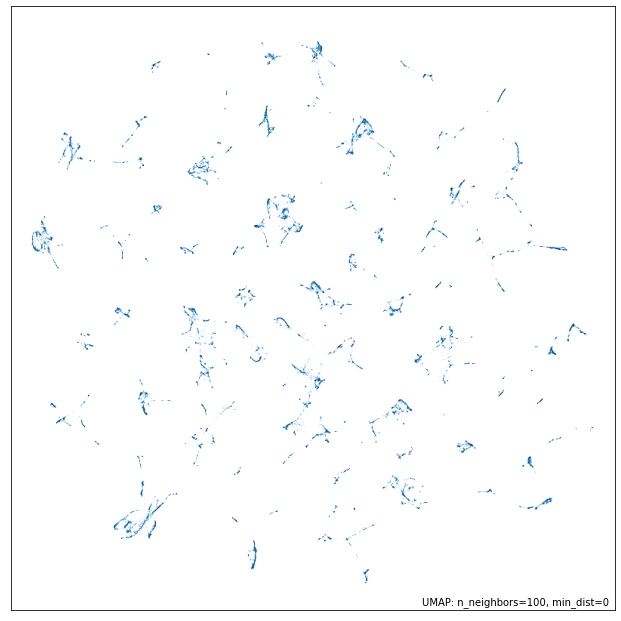

...

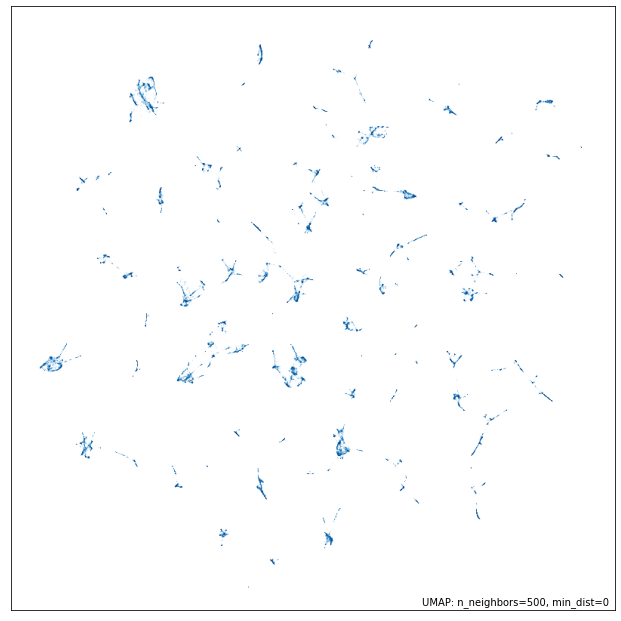

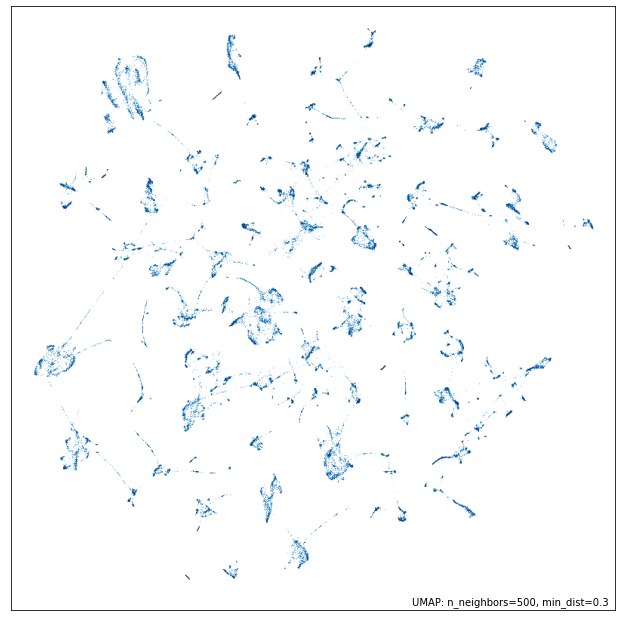

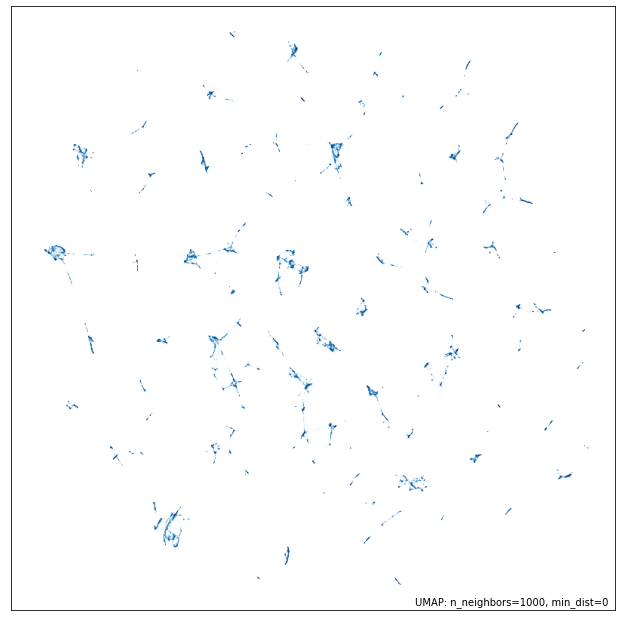

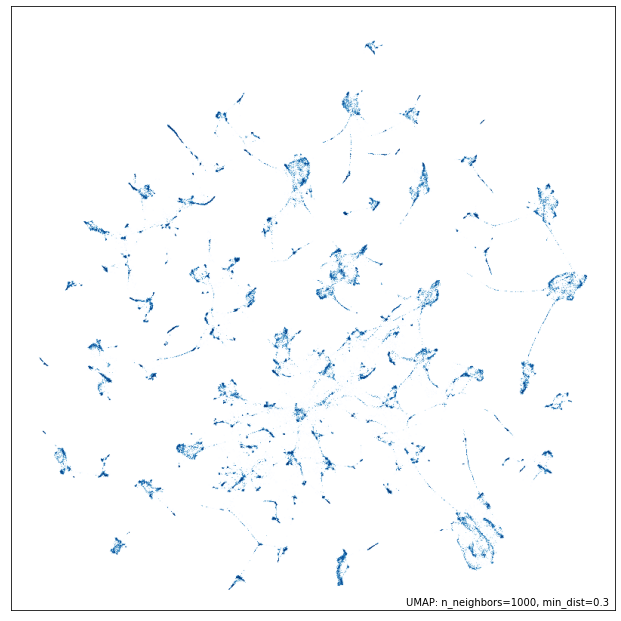

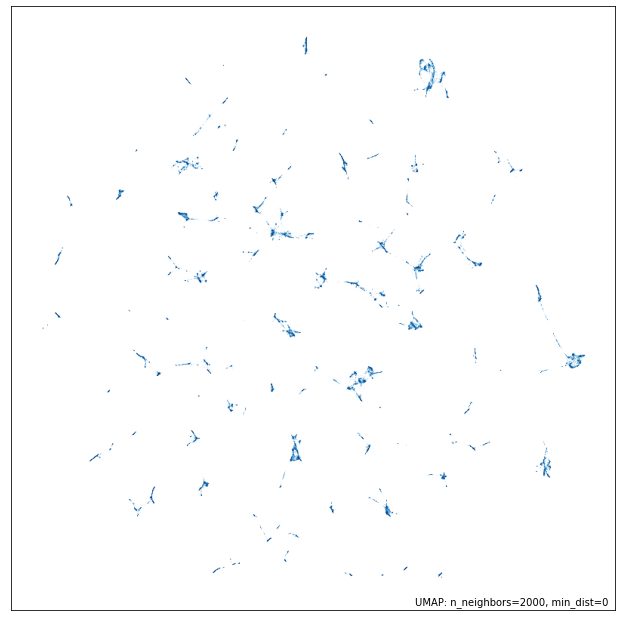

In [ ]:
results = {}
for n_neighbors in [10, 50, 100, 150, 200, 250, 300, 500, 1000, 2000, 5000]:
    for min_dist in [0, 0.3]:
        mapper = umap.UMAP(n_neighbors=n_neighbors, min_dist=min_dist).fit(egocentric_dist)
        results[(n_neighbors, min_dist)] = mapper
        #plt.scatter(X_embedded_umap[:, 0], X_embedded_umap[:, 1], s= 0.1)
        p = umap.plot.points(mapper)
        umap.plot.show(p)

In [63]:
umap.plot.connectivity(mapper, show_points=True)

KeyboardInterrupt: 

In [ ]:
umap.plot.connectivity(mapper, edge_bundling='hammer')

C:\Users\Kevin\Anaconda3\envs\lfp-behavior\lib\site-packages\umap\plot.py:855: UserWarning: Hammer edge bundling is expensive for large graphs!
This may take a long time to compute!
  "Hammer edge bundling is expensive for large graphs!\n"


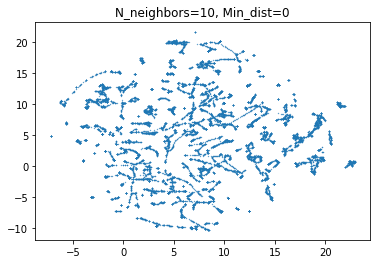

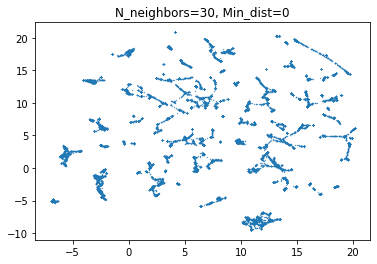

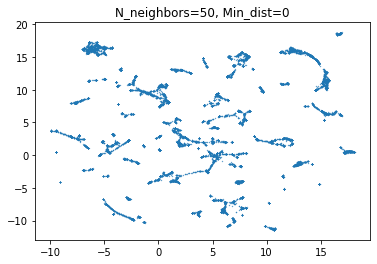

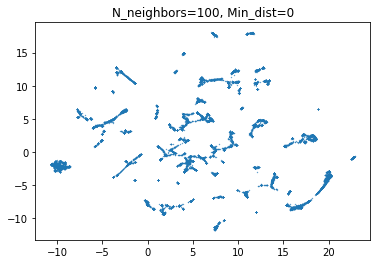

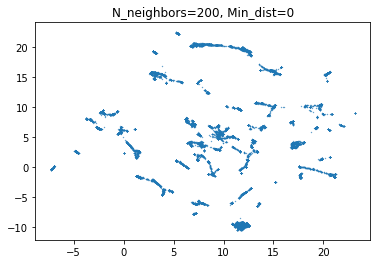

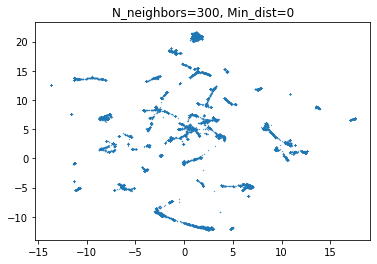

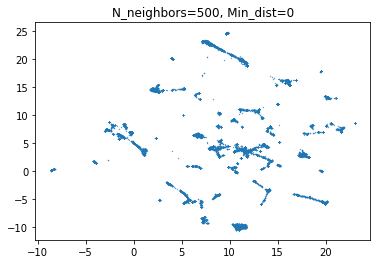

In [18]:
results = {}
for n_neighbors in [100]:
    for min_dist in [0]:
        X_embedded_umap = umap.UMAP(n_neighbors=n_neighbors, min_dist=min_dist).fit_transform(inter_bat_dist_ds)
        results[(n_neighbors, min_dist)] = X_embedded_umap
        plt.title('N_neighbors={}, Min_dist={}'.format(n_neighbors, min_dist))
        plt.scatter(X_embedded_umap[:, 0], X_embedded_umap[:, 1], s= 0.1)
        plt.show()

In [59]:
results

{(300,
  0.6): array([[ 3.1995187 , -0.7656299 ],
        [ 3.2149427 , -0.77630764],
        [ 3.3018975 , -0.7730375 ],
        ...,
        [17.254436  , 12.138452  ],
        [17.089146  , 12.001948  ],
        [17.038944  , 12.155536  ]], dtype=float32),
 (300,
  0.9): array([[ 6.5871954, 11.331933 ],
        [ 6.5337634, 11.393494 ],
        [ 6.6618314, 11.50984  ],
        ...,
        [-7.3654733, -3.0643115],
        [-7.5237575, -3.173066 ],
        [-7.348531 , -2.9079716]], dtype=float32)}

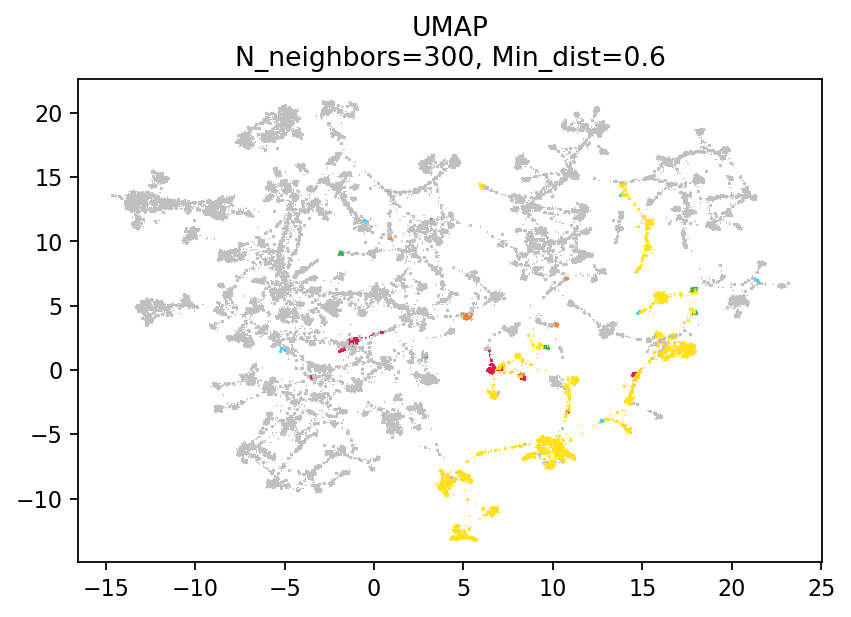

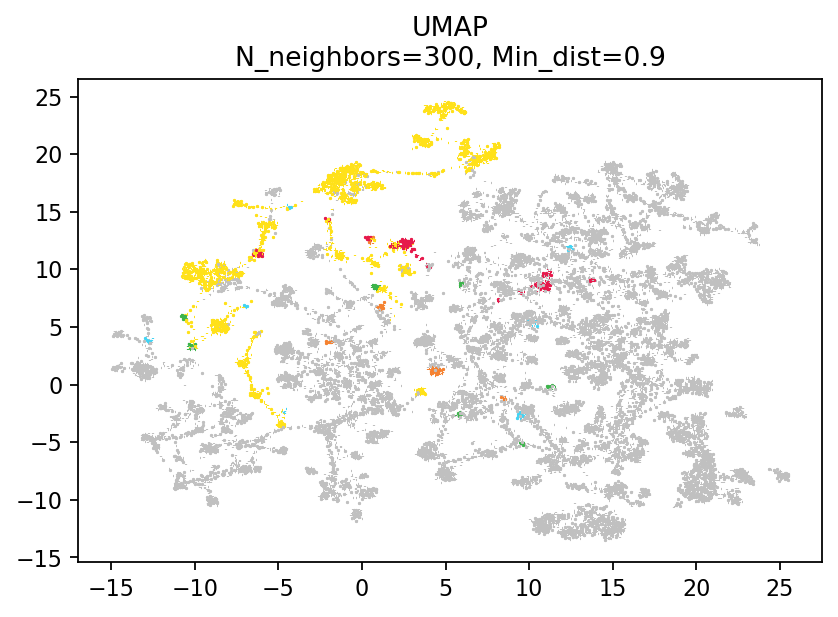

In [166]:
for n_neighbors in [300]:
    for min_dist in [0.6, 0.9]:
        X_embedded_umap = results[(n_neighbors, min_dist)]
        plt.figure(dpi=160)
        plt.title('UMAP\nN_neighbors={}, Min_dist={}'.format(n_neighbors, min_dist))
        plt.scatter(X_embedded_umap[:, 0], X_embedded_umap[:, 1], s= 0.05, c=bforage_colormap,marker=',')
        plt.show()

In [146]:
X[:,:3].shape

(33000, 3)

In [154]:
X_embedded_umap = umap.UMAP(n_neighbors=50, min_dist=0.1).fit_transform(X[:,:3])

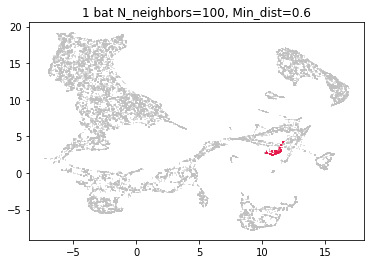

In [157]:
bat1_bflying_colormap = []
for i in range(len(bflying_ds)):
    if(np.linalg.norm(X[i,:3] - np.array([-0.29, 0.05, 0.45])) < 0.3):
        bat1_bflying_colormap.append('#e6194B') # red
    else:
        bat1_bflying_colormap.append('#c0c0c0') # grey

plt.title('1 bat N_neighbors={}, Min_dist={}'.format(100, 0.6))
plt.scatter(X_embedded_umap[:, 0], X_embedded_umap[:, 1], s= 0.05, c=bat1_bflying_colormap,marker=',')
plt.show()

# t-SNE

In [61]:
X_embedded = TSNE(n_components=2, perplexity=50, verbose = 1, n_iter = 2000, n_jobs = -1).fit_transform(X)

[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 33000 samples in 0.094s...
[t-SNE] Computed neighbors for 33000 samples in 1.560s...
[t-SNE] Computed conditional probabilities for sample 1000 / 33000
[t-SNE] Computed conditional probabilities for sample 2000 / 33000
[t-SNE] Computed conditional probabilities for sample 3000 / 33000
[t-SNE] Computed conditional probabilities for sample 4000 / 33000
[t-SNE] Computed conditional probabilities for sample 5000 / 33000
[t-SNE] Computed conditional probabilities for sample 6000 / 33000
[t-SNE] Computed conditional probabilities for sample 7000 / 33000
[t-SNE] Computed conditional probabilities for sample 8000 / 33000
[t-SNE] Computed conditional probabilities for sample 9000 / 33000
[t-SNE] Computed conditional probabilities for sample 10000 / 33000
[t-SNE] Computed conditional probabilities for sample 11000 / 33000
[t-SNE] Computed conditional probabilities for sample 12000 / 33000
[t-SNE] Computed conditional probabilities for sa

Text(0.5, 1.0, 't-SNE\n(perplexity=50, iterations=2000, downsample=10x)')

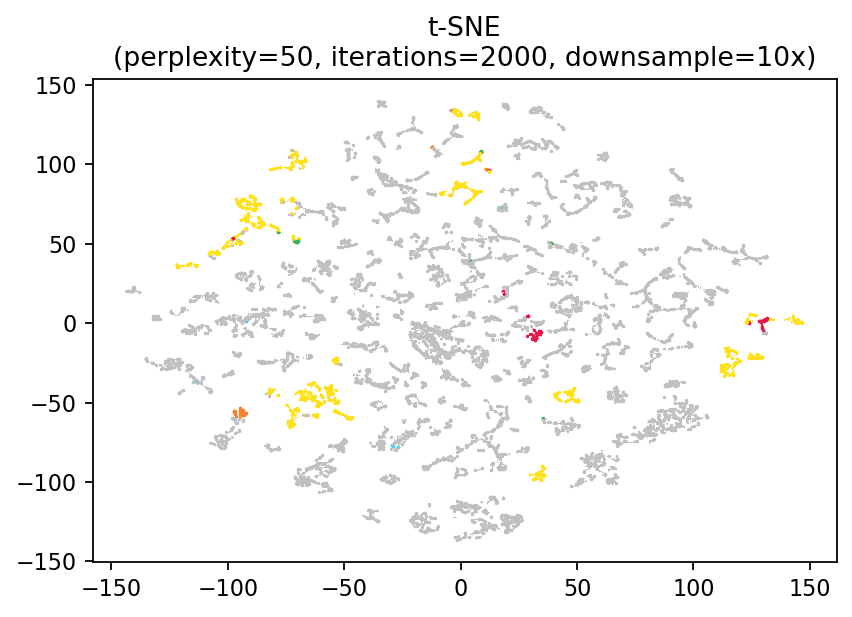

In [175]:
plt.figure(dpi=160)
plt.scatter(X_embedded[:, 0], X_embedded[:, 1], s= 0.05, c=bforage_colormap,marker=',')
plt.title('t-SNE\n(perplexity=50, iterations=2000, downsample=10x)')

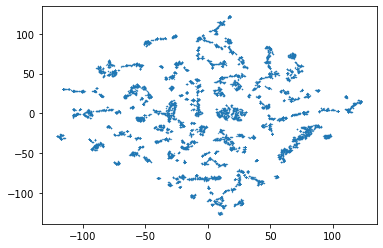

In [131]:
plt.scatter(X_embedded[:, 0], X_embedded[:, 1], s= 0.1)

In [40]:
def plot_bat(X, t):
    for i in range(N):
        plt.scatter(X[t,2*i-1], X[t, 2*i])

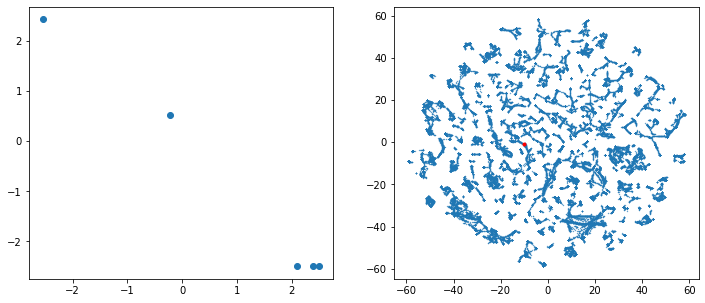

<Figure size 432x288 with 0 Axes>

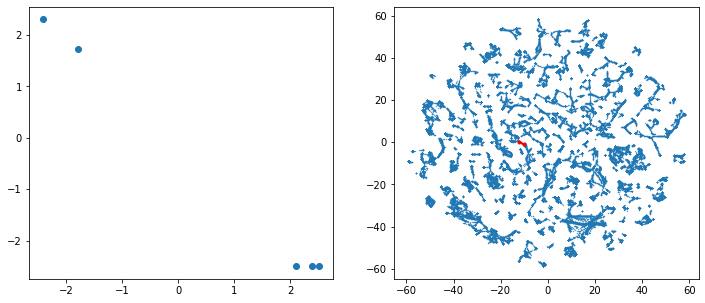

<Figure size 432x288 with 0 Axes>

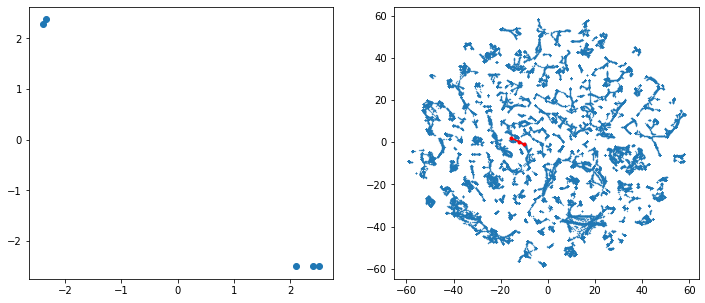

<Figure size 432x288 with 0 Axes>

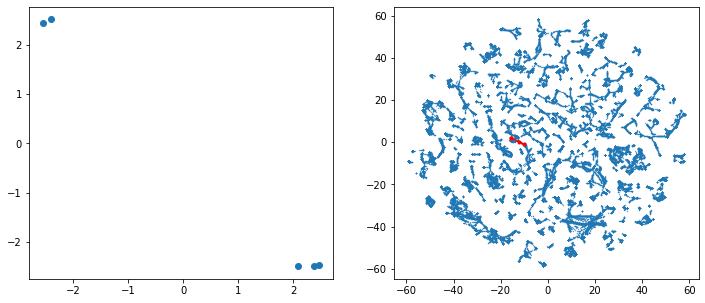

<Figure size 432x288 with 0 Axes>

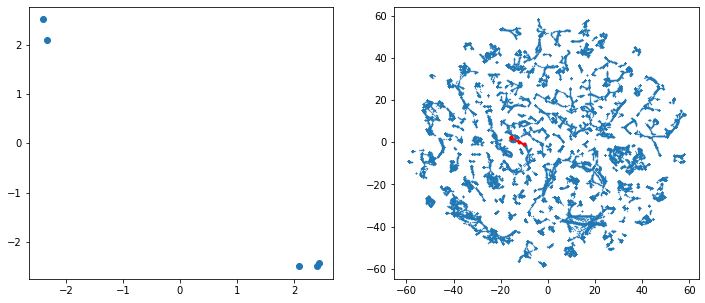

<Figure size 432x288 with 0 Axes>

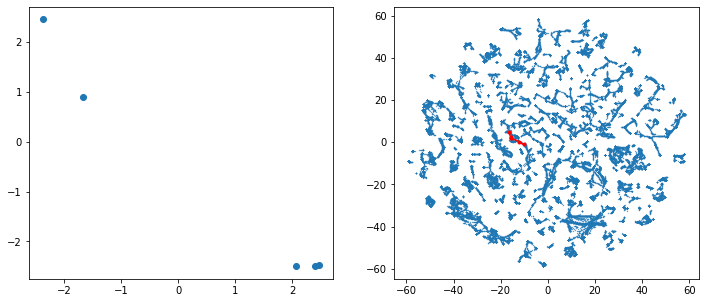

<Figure size 432x288 with 0 Axes>

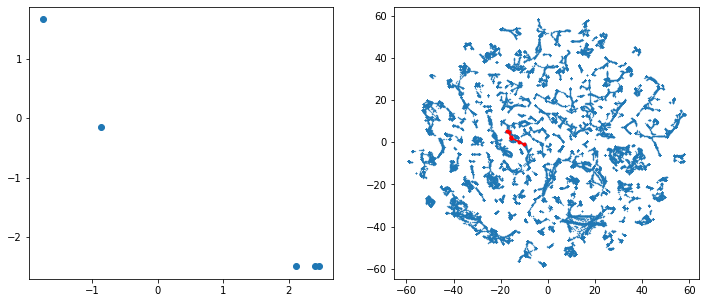

<Figure size 432x288 with 0 Axes>

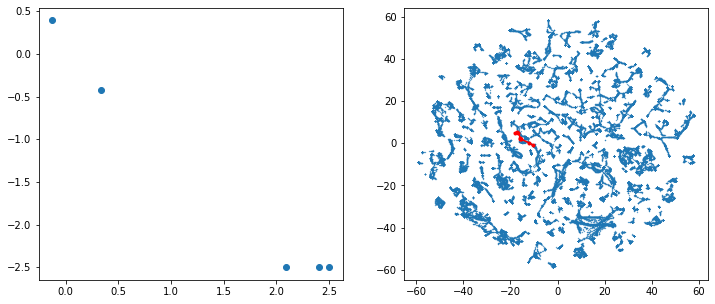

<Figure size 432x288 with 0 Axes>

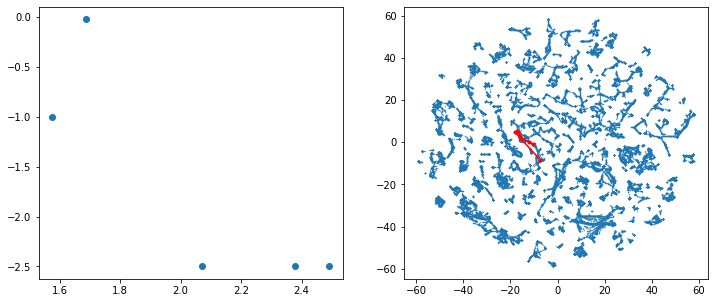

<Figure size 432x288 with 0 Axes>

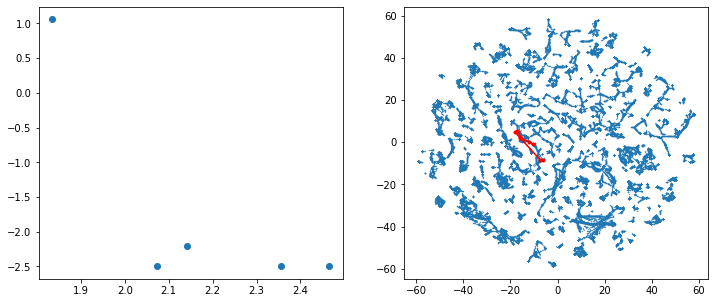

<Figure size 432x288 with 0 Axes>

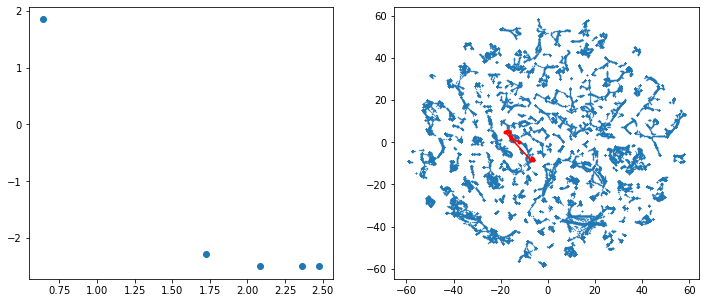

<Figure size 432x288 with 0 Axes>

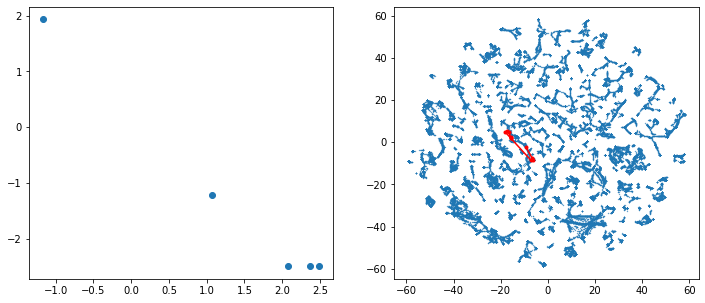

<Figure size 432x288 with 0 Axes>

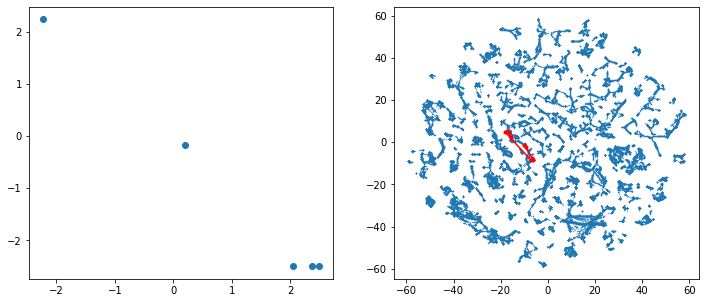

<Figure size 432x288 with 0 Axes>

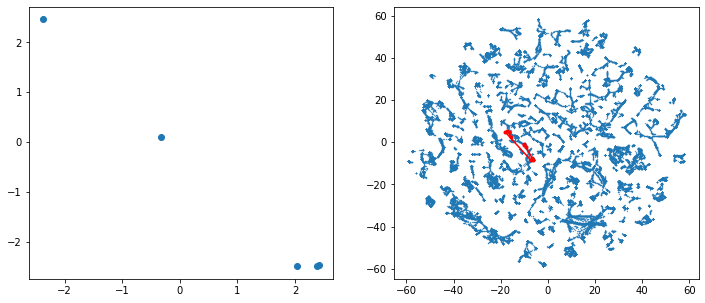

<Figure size 432x288 with 0 Axes>

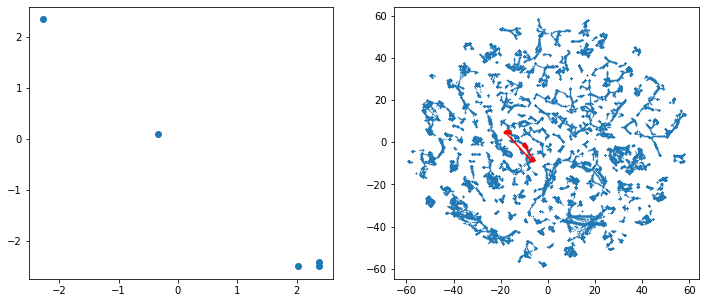

<Figure size 432x288 with 0 Axes>

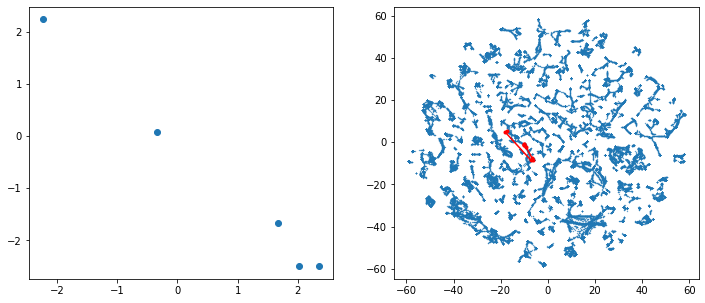

<Figure size 432x288 with 0 Axes>

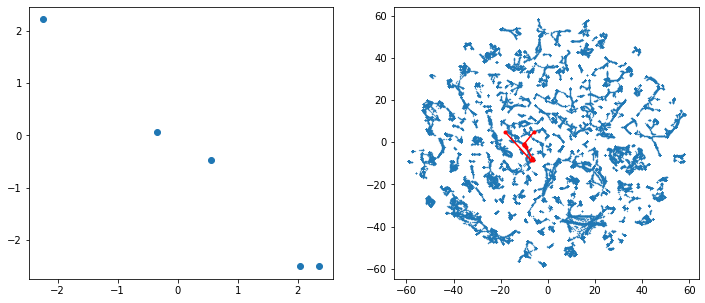

<Figure size 432x288 with 0 Axes>

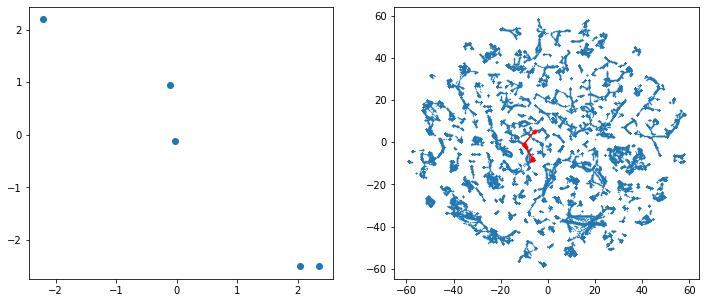

<Figure size 432x288 with 0 Axes>

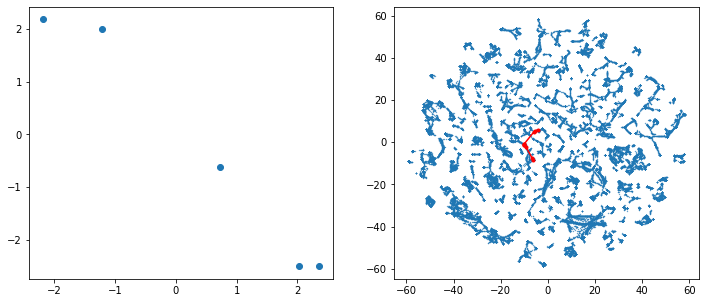

<Figure size 432x288 with 0 Axes>

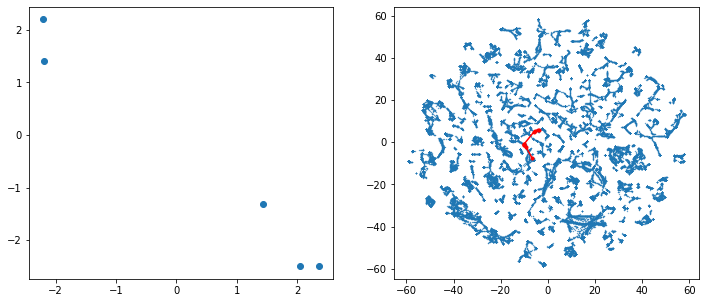

<Figure size 432x288 with 0 Axes>

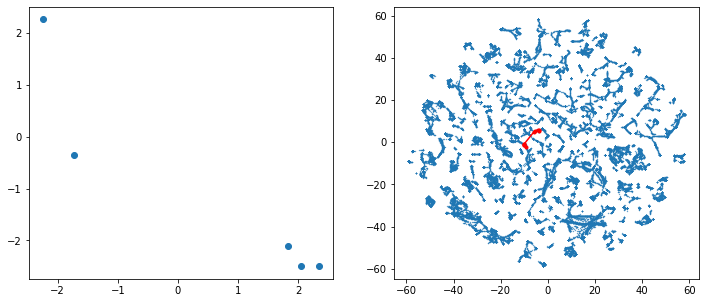

<Figure size 432x288 with 0 Axes>

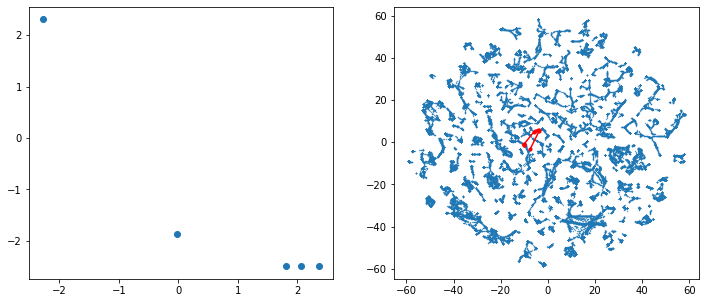

<Figure size 432x288 with 0 Axes>

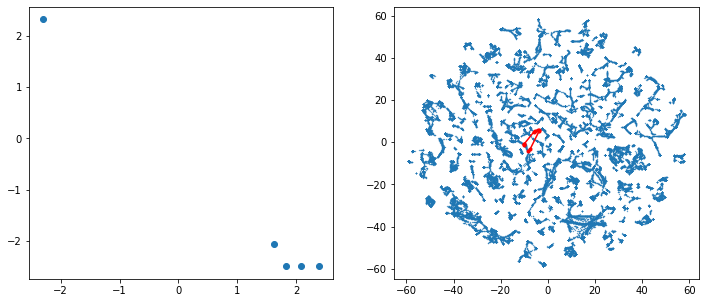

<Figure size 432x288 with 0 Axes>

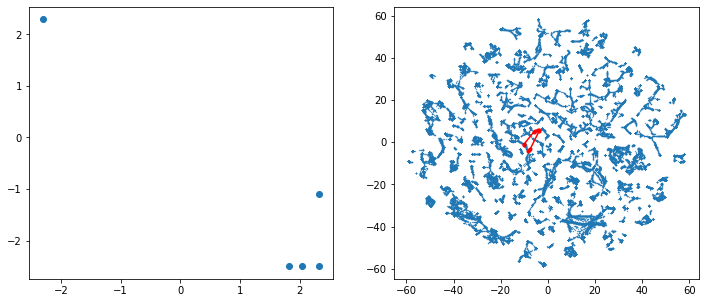

<Figure size 432x288 with 0 Axes>

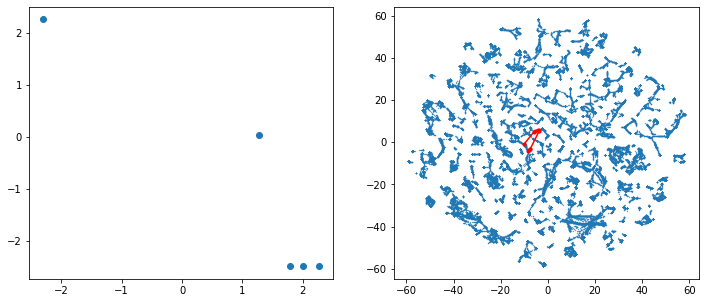

<Figure size 432x288 with 0 Axes>

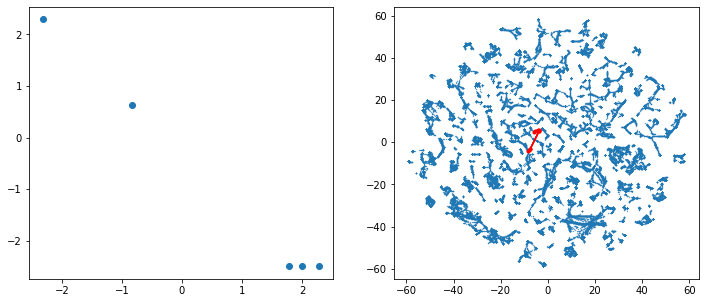

<Figure size 432x288 with 0 Axes>

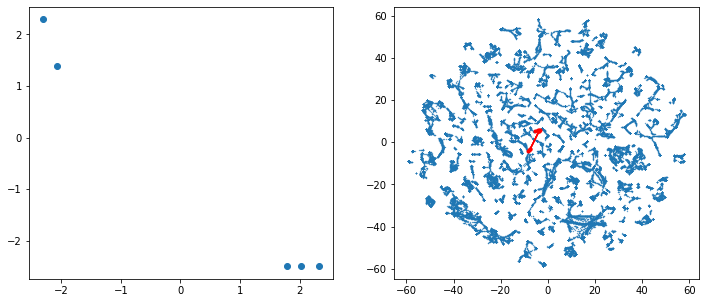

<Figure size 432x288 with 0 Axes>

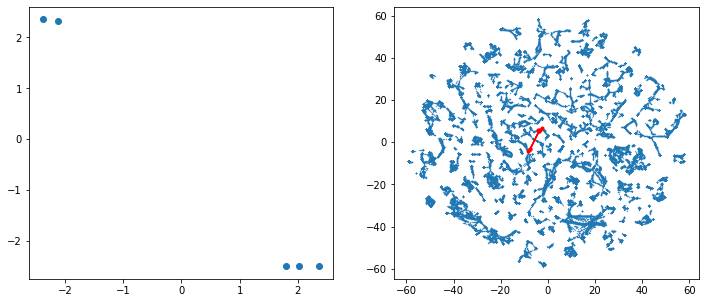

<Figure size 432x288 with 0 Axes>

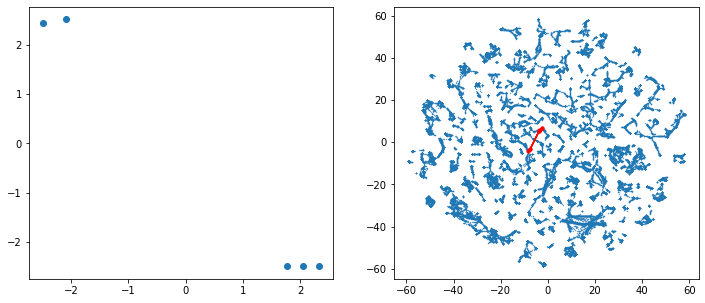

<Figure size 432x288 with 0 Axes>

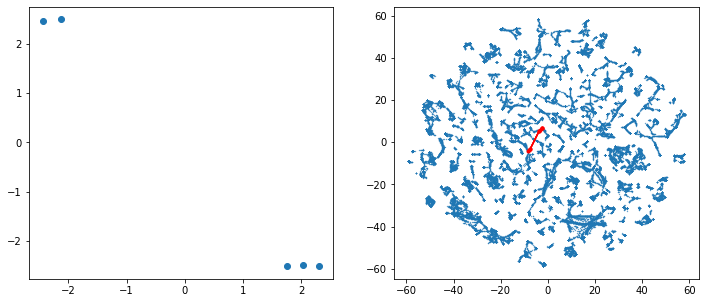

<Figure size 432x288 with 0 Axes>

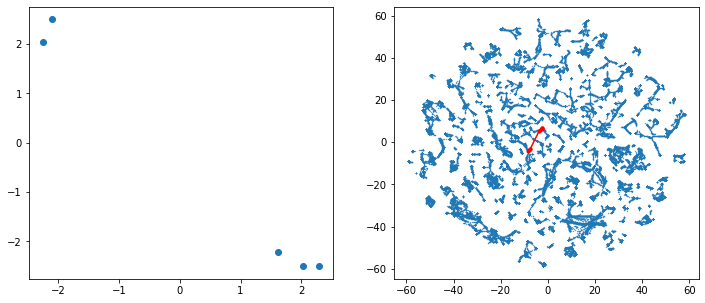

<Figure size 432x288 with 0 Axes>

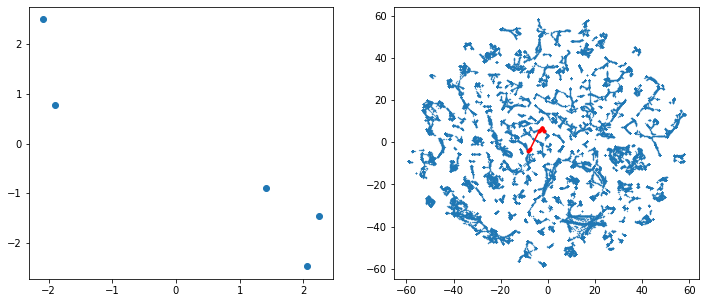

<Figure size 432x288 with 0 Axes>

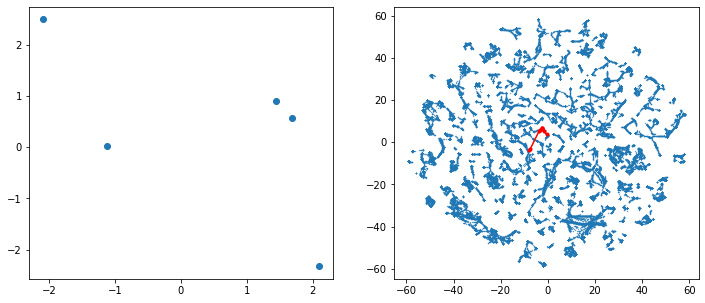

<Figure size 432x288 with 0 Axes>

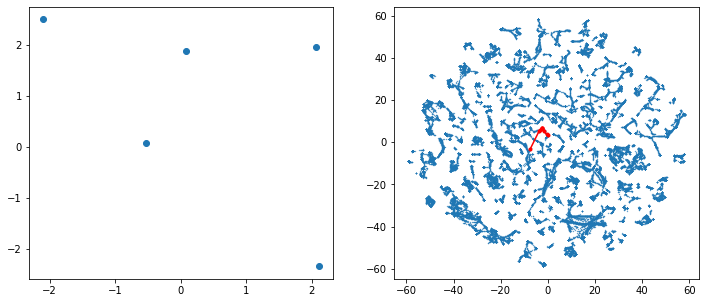

<Figure size 432x288 with 0 Axes>

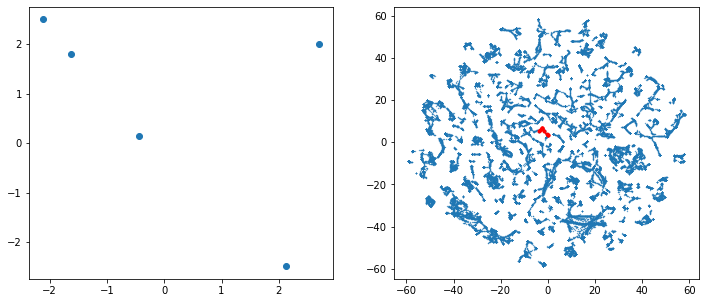

<Figure size 432x288 with 0 Axes>

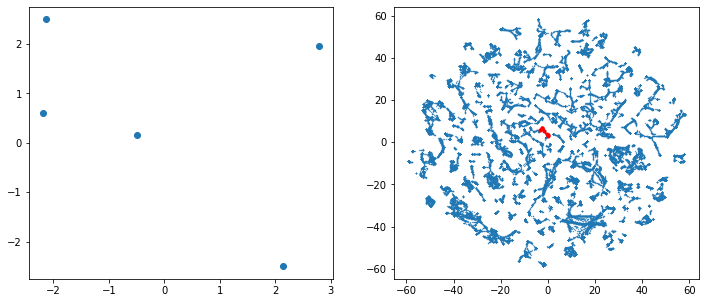

<Figure size 432x288 with 0 Axes>

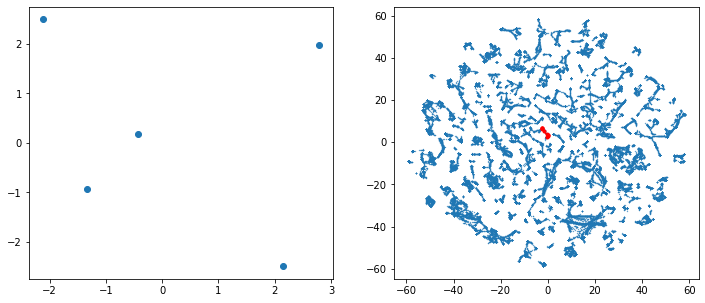

<Figure size 432x288 with 0 Axes>

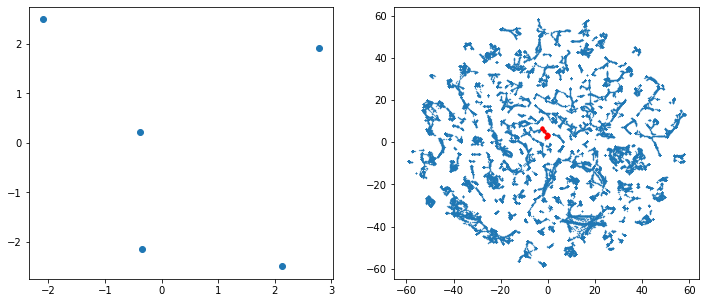

<Figure size 432x288 with 0 Axes>

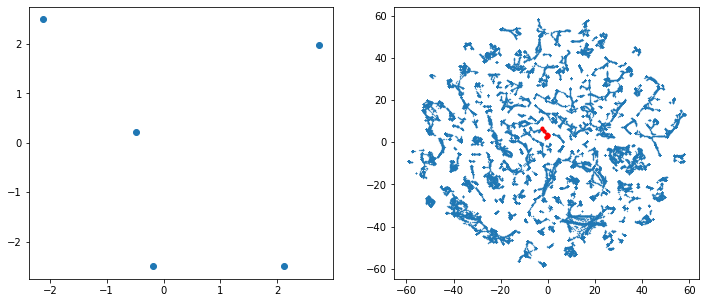

<Figure size 432x288 with 0 Axes>

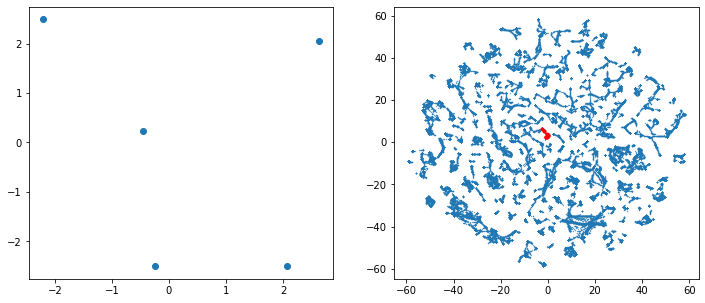

<Figure size 432x288 with 0 Axes>

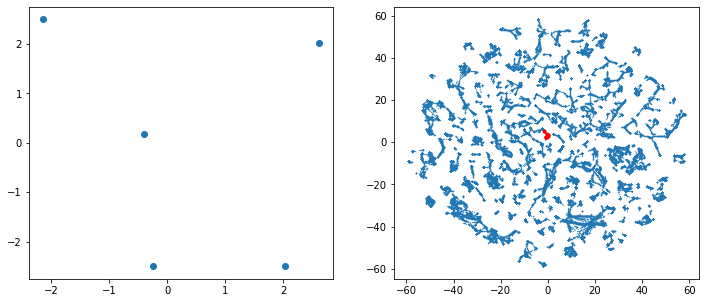

<Figure size 432x288 with 0 Axes>

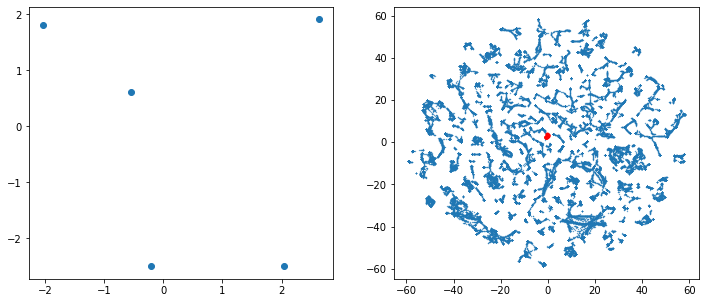

<Figure size 432x288 with 0 Axes>

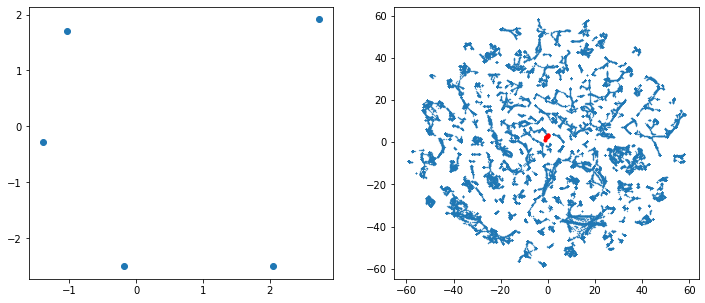

<Figure size 432x288 with 0 Axes>

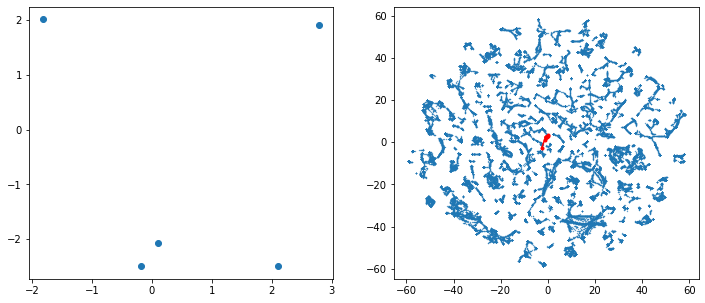

<Figure size 432x288 with 0 Axes>

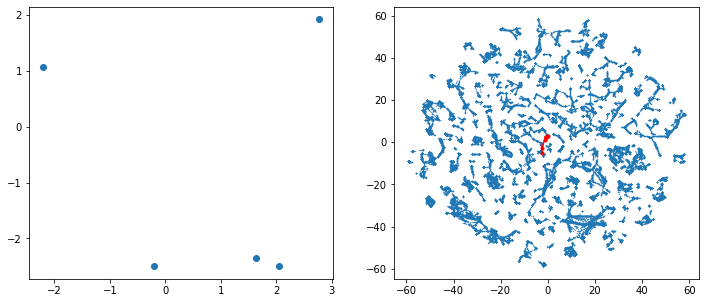

<Figure size 432x288 with 0 Axes>

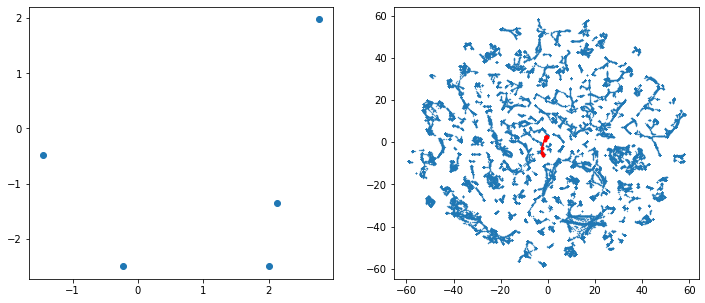

<Figure size 432x288 with 0 Axes>

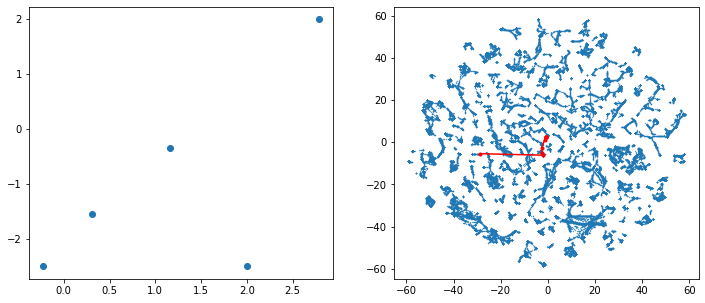

<Figure size 432x288 with 0 Axes>

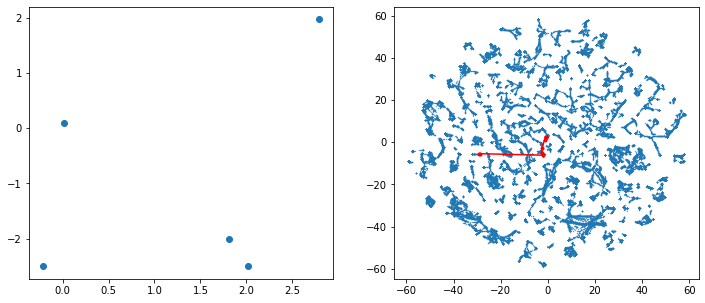

<Figure size 432x288 with 0 Axes>

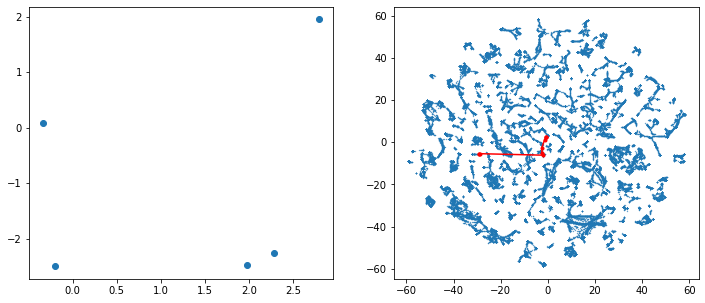

<Figure size 432x288 with 0 Axes>

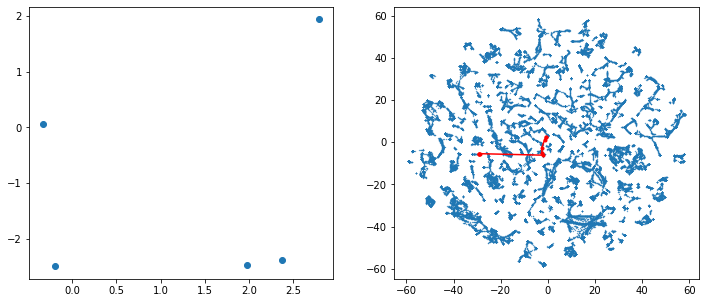

<Figure size 432x288 with 0 Axes>

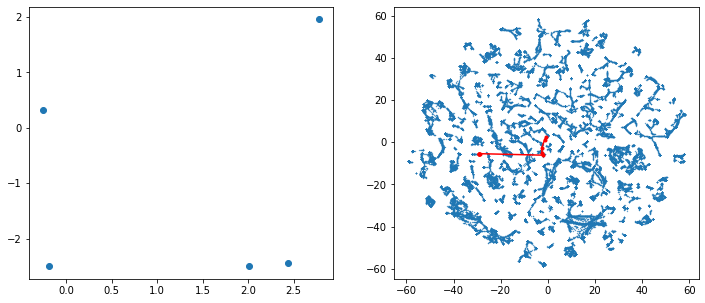

<Figure size 432x288 with 0 Axes>

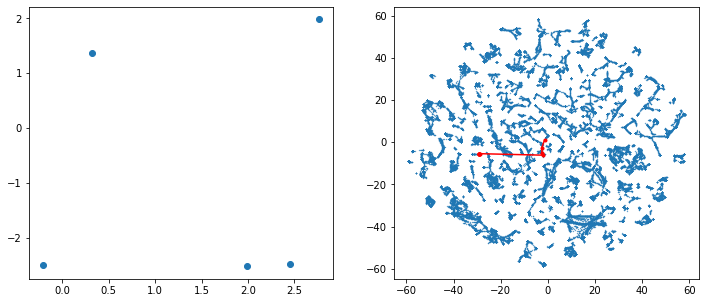

<Figure size 432x288 with 0 Axes>

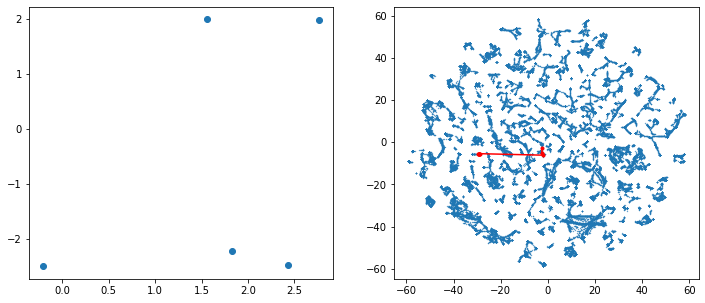

<Figure size 432x288 with 0 Axes>

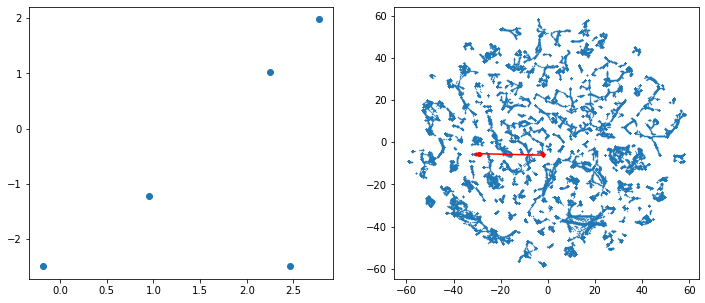

<Figure size 432x288 with 0 Axes>

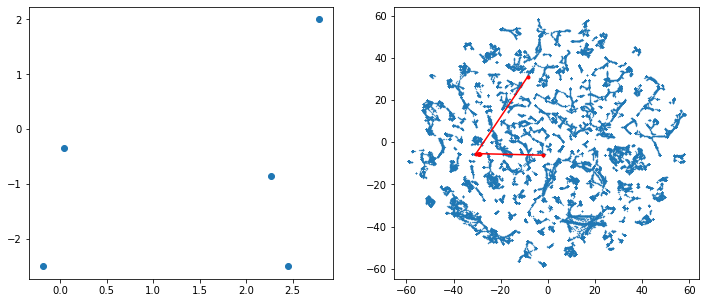

<Figure size 432x288 with 0 Axes>

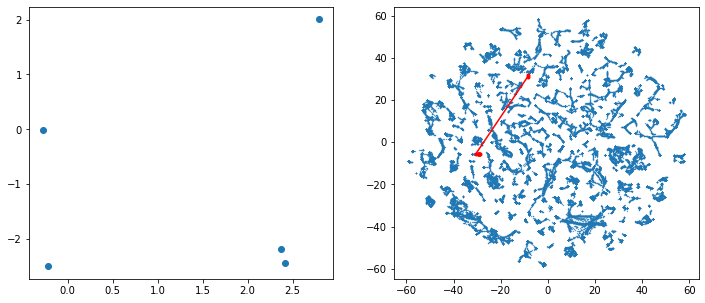

<Figure size 432x288 with 0 Axes>

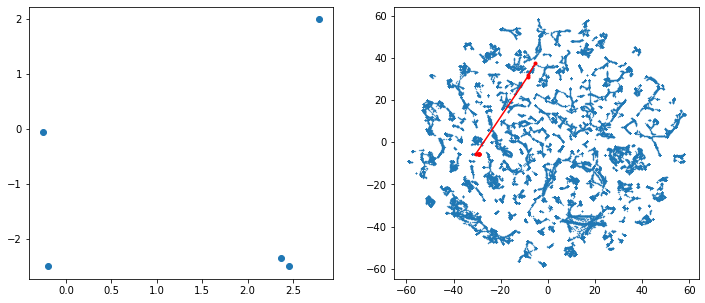

<Figure size 432x288 with 0 Axes>

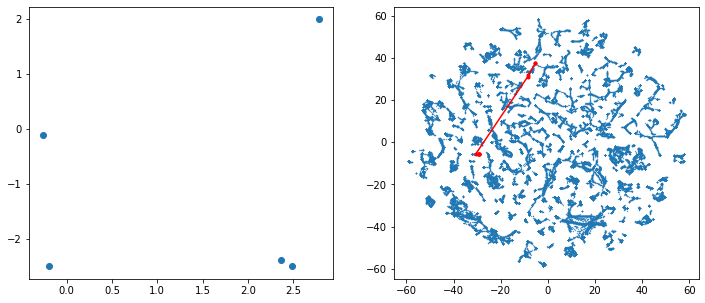

<Figure size 432x288 with 0 Axes>

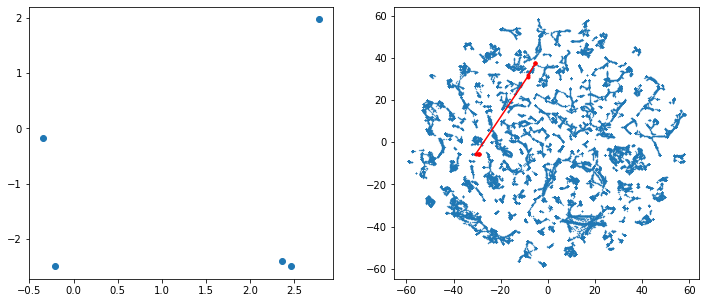

<Figure size 432x288 with 0 Axes>

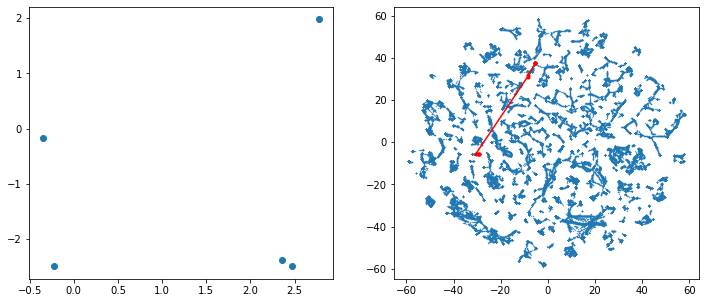

<Figure size 432x288 with 0 Axes>

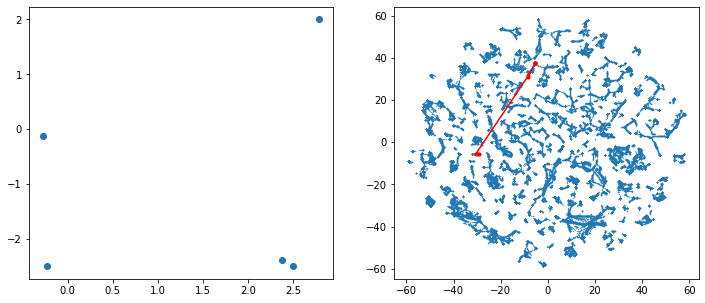

<Figure size 432x288 with 0 Axes>

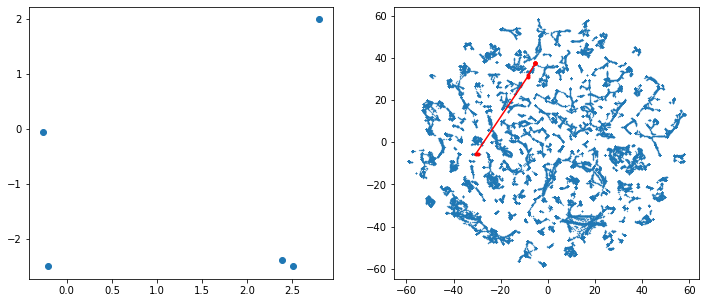

<Figure size 432x288 with 0 Axes>

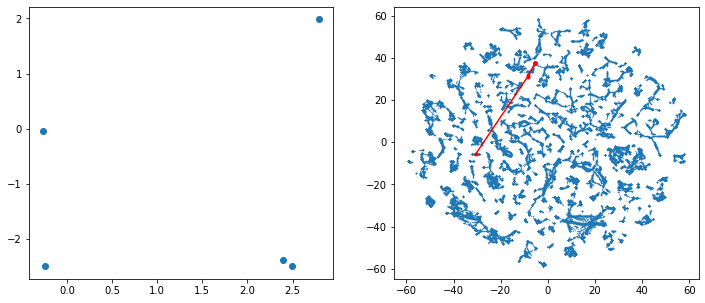

<Figure size 432x288 with 0 Axes>

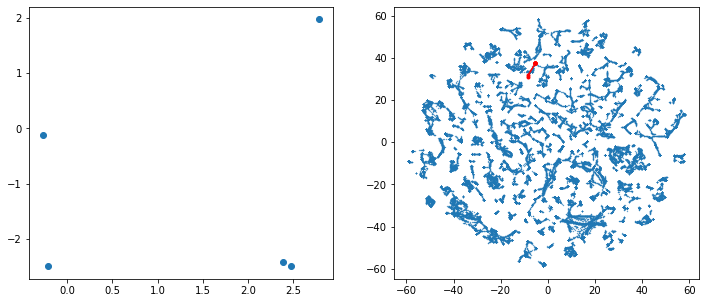

<Figure size 432x288 with 0 Axes>

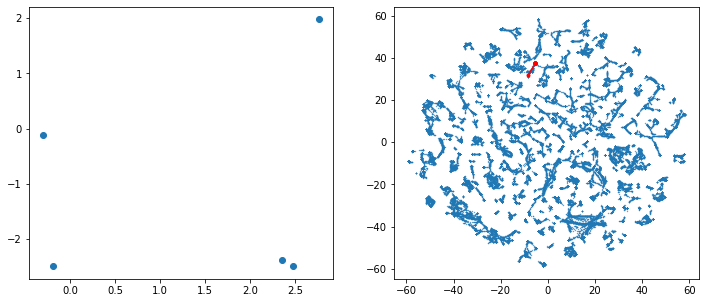

<Figure size 432x288 with 0 Axes>

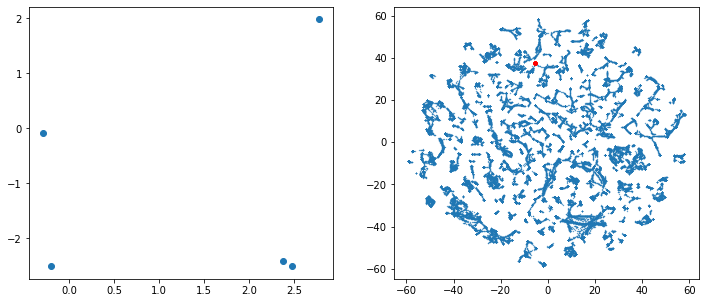

<Figure size 432x288 with 0 Axes>

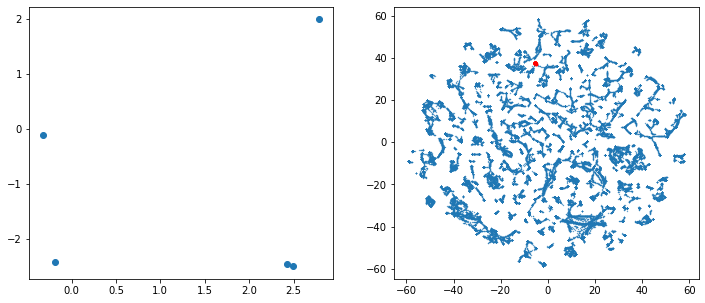

<Figure size 432x288 with 0 Axes>

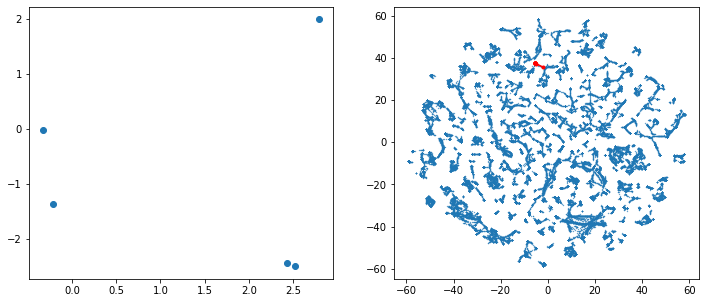

<Figure size 432x288 with 0 Axes>

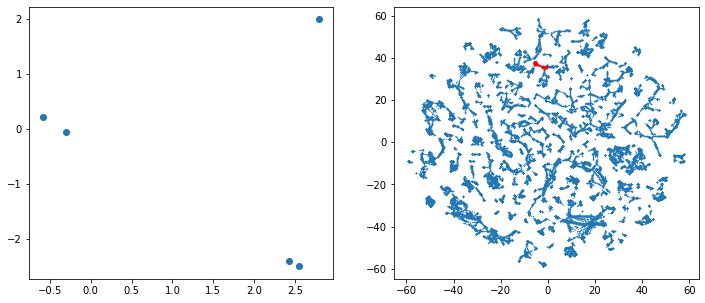

<Figure size 432x288 with 0 Axes>

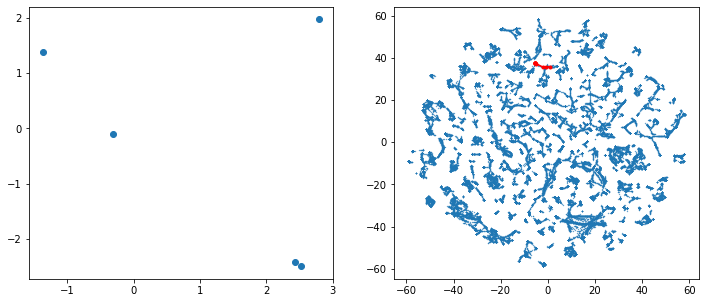

<Figure size 432x288 with 0 Axes>

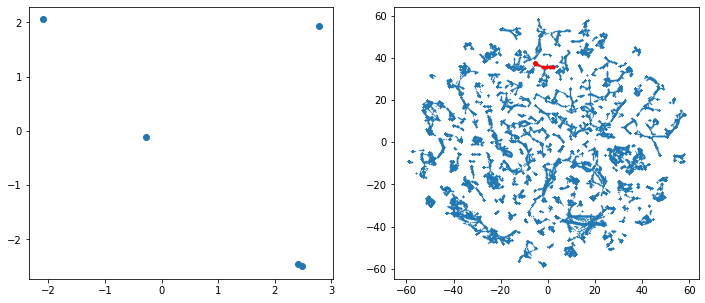

<Figure size 432x288 with 0 Axes>

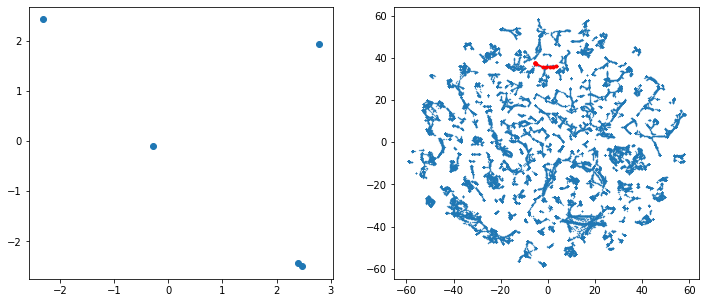

<Figure size 432x288 with 0 Axes>

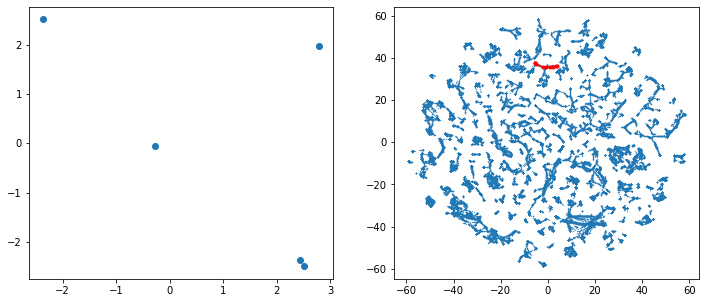

<Figure size 432x288 with 0 Axes>

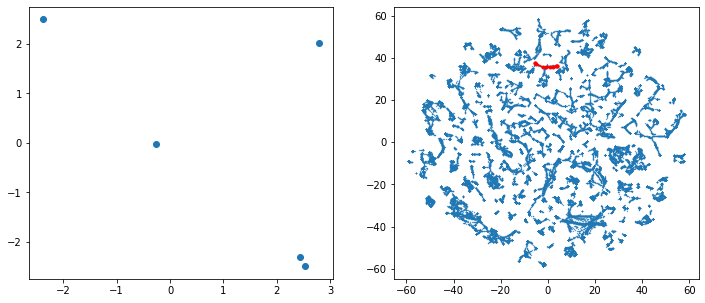

<Figure size 432x288 with 0 Axes>

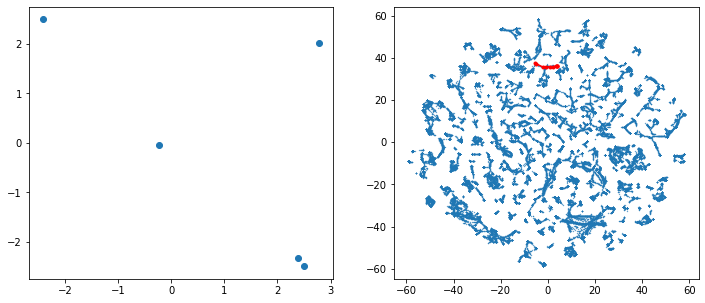

<Figure size 432x288 with 0 Axes>

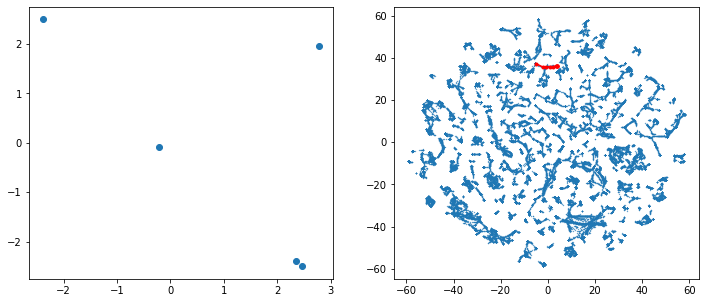

<Figure size 432x288 with 0 Axes>

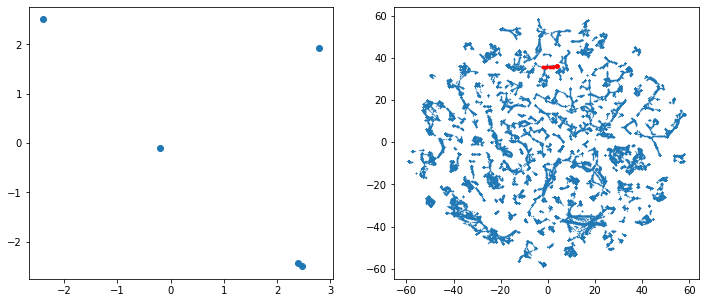

<Figure size 432x288 with 0 Axes>

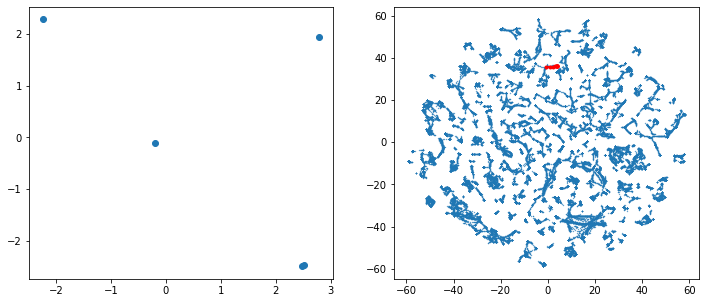

<Figure size 432x288 with 0 Axes>

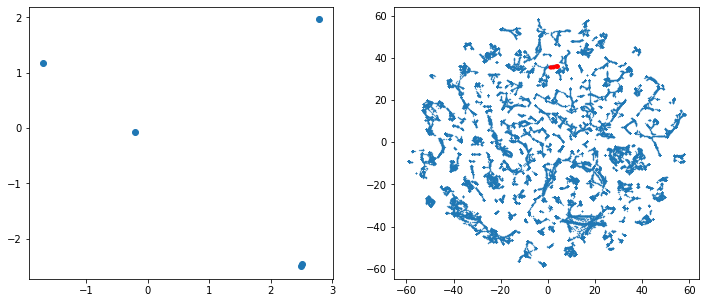

<Figure size 432x288 with 0 Axes>

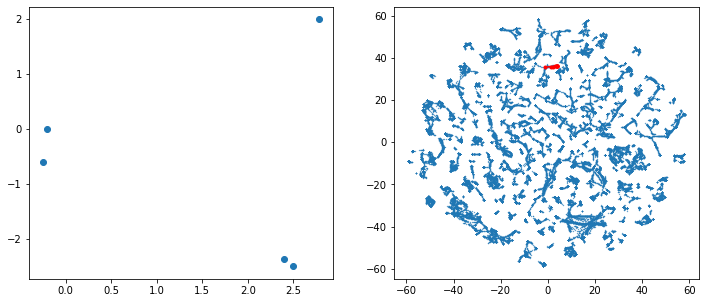

<Figure size 432x288 with 0 Axes>

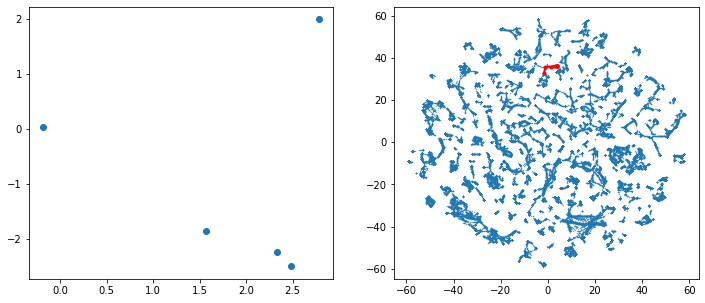

<Figure size 432x288 with 0 Axes>

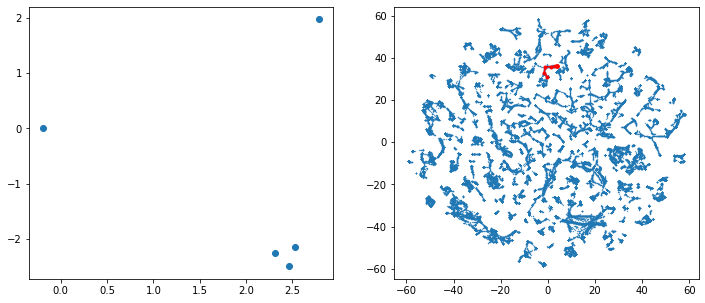

<Figure size 432x288 with 0 Axes>

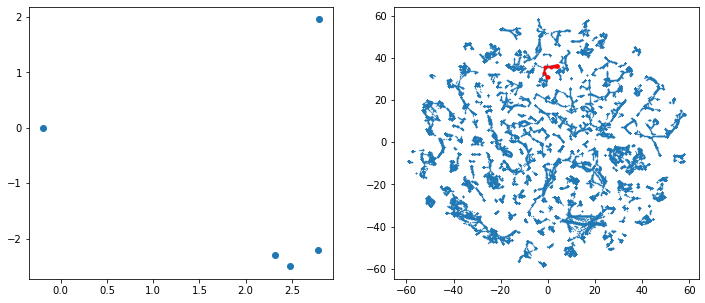

<Figure size 432x288 with 0 Axes>

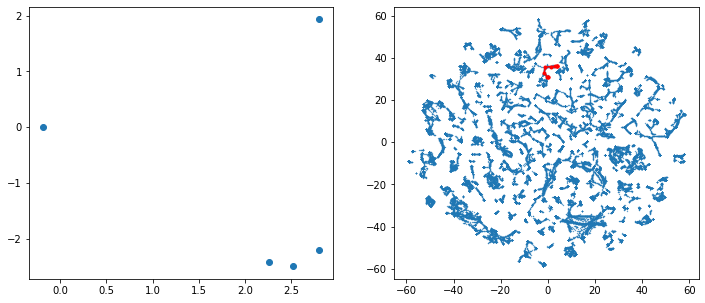

<Figure size 432x288 with 0 Axes>

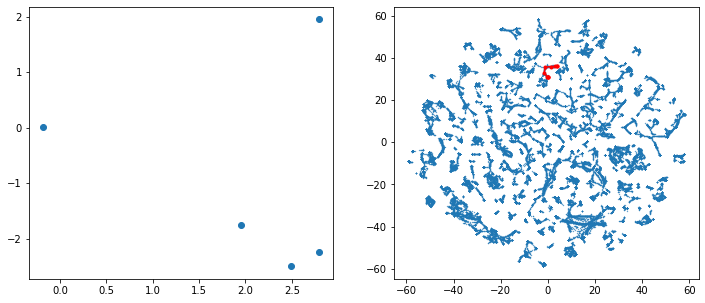

<Figure size 432x288 with 0 Axes>

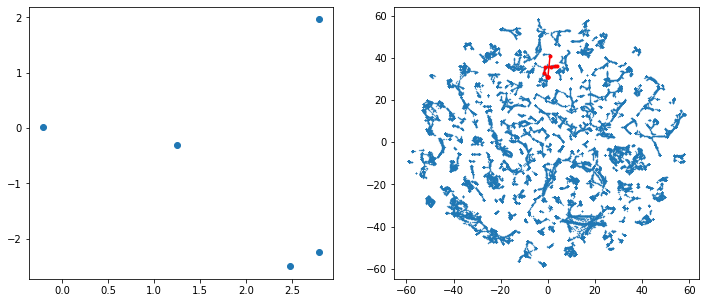

<Figure size 432x288 with 0 Axes>

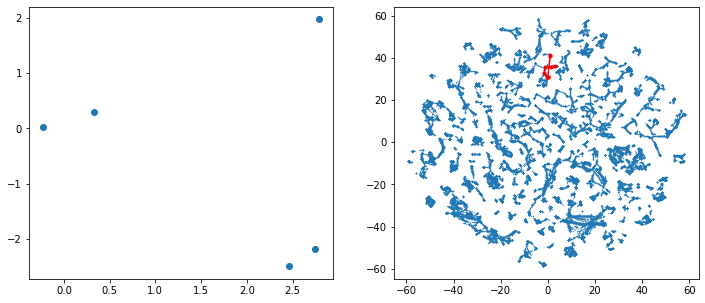

<Figure size 432x288 with 0 Axes>

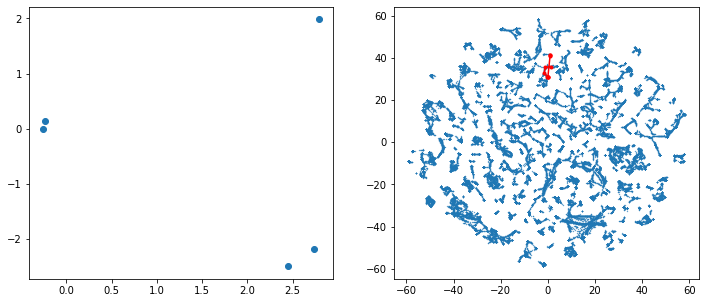

<Figure size 432x288 with 0 Axes>

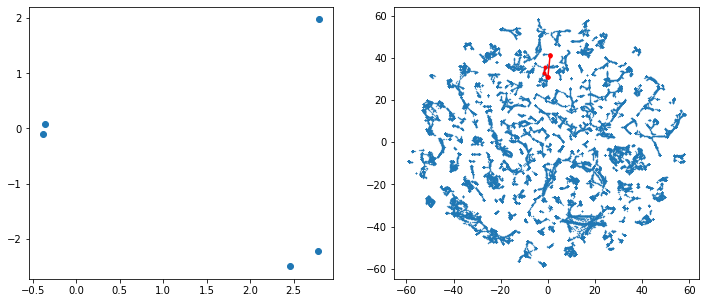

<Figure size 432x288 with 0 Axes>

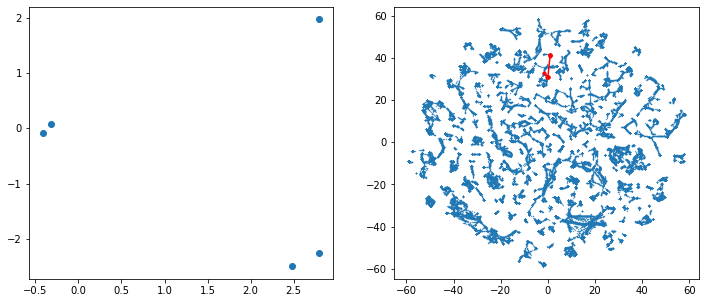

<Figure size 432x288 with 0 Axes>

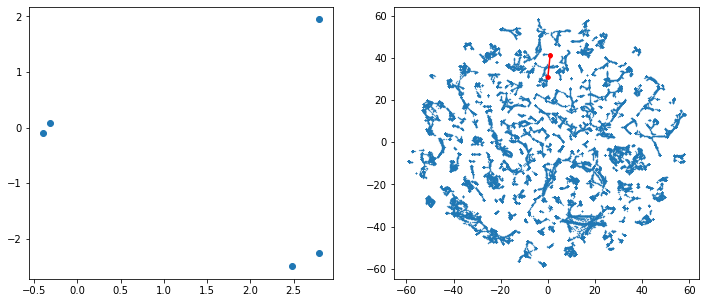

<Figure size 432x288 with 0 Axes>

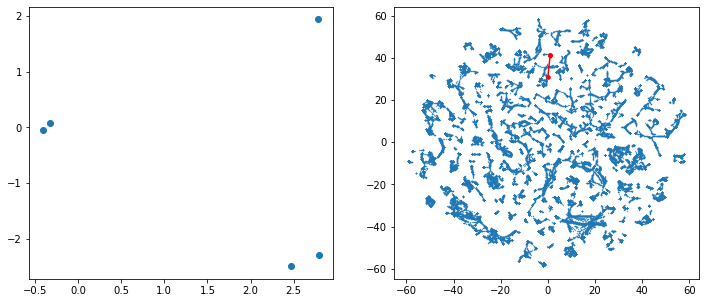

<Figure size 432x288 with 0 Axes>

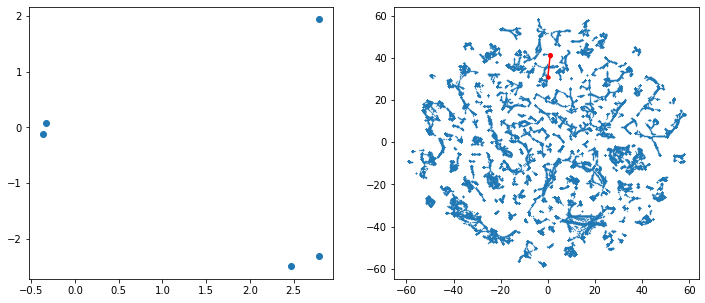

<Figure size 432x288 with 0 Axes>

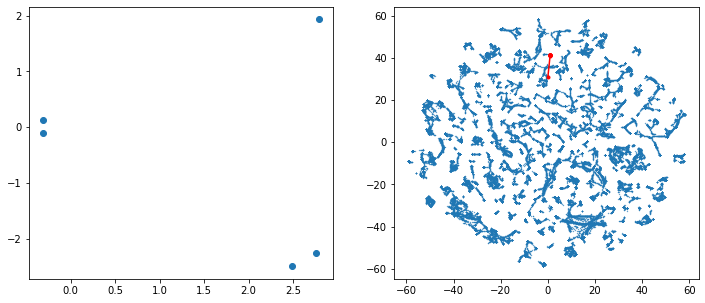

<Figure size 432x288 with 0 Axes>

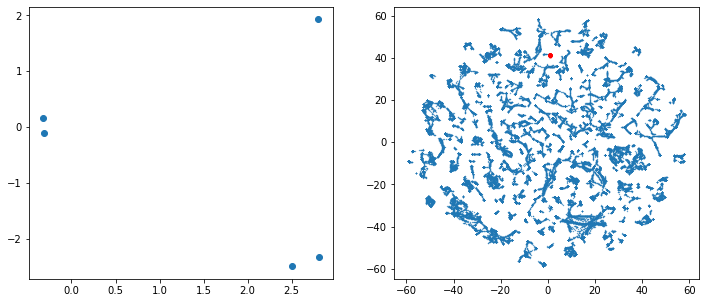

<Figure size 432x288 with 0 Axes>

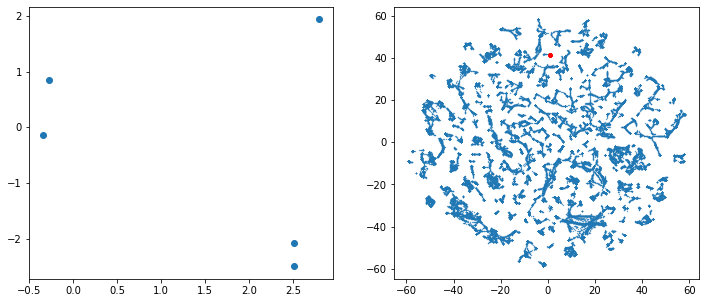

<Figure size 432x288 with 0 Axes>

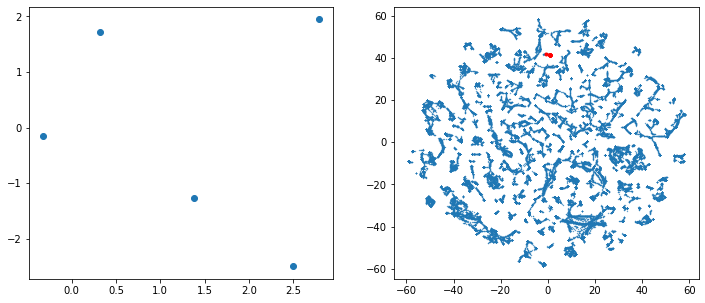

<Figure size 432x288 with 0 Axes>

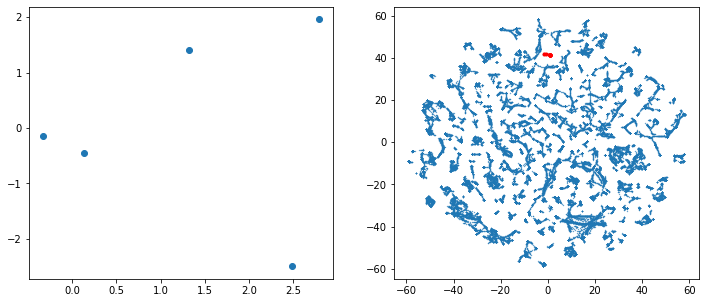

<Figure size 432x288 with 0 Axes>

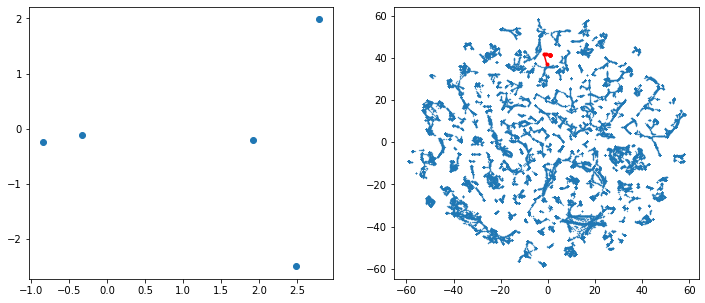

<Figure size 432x288 with 0 Axes>

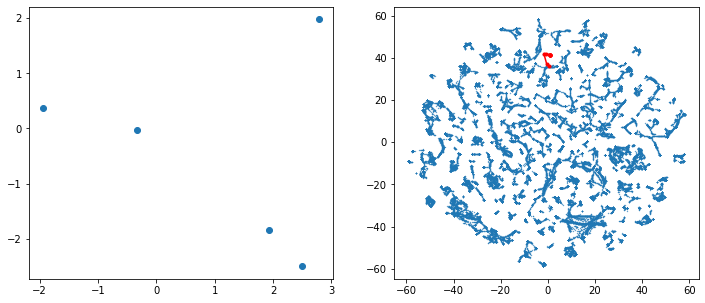

<Figure size 432x288 with 0 Axes>

In [107]:
visited_x = []
visited_y = []
for t in range(1000)[::10]:
    fig = plt.figure(figsize=(12,5))
    ax_pos = fig.add_subplot(1,2,1)
    ax_embed = fig.add_subplot(1,2,2)
    ax_pos.scatter(X[t,[0,2,4,6,8]], X[t, [1,3,5,7,9]])
    
    ax_embed.scatter(X_embedded[:, 0], X_embedded[:, 1], s=0.1)
    visited_x.append(X_embedded[t,0])
    visited_y.append(X_embedded[t,1])
    ax_embed.plot(visited_x[-10:], visited_y[-10:], '.r-')
    
    
    plt.show()
    plt.clf()

array([-1.73625706, -1.9118985 , -2.03774085, -1.73231066, -1.55725063])